# Social Graphs Final Project - Wikitubia

## 1. Motivation

For our analysis we chose to use Wikitubia, the wikipedia of youtubers. Everyone is familiar with youtube, but if you are more than a casual user of the site that occasionally pops by, you probably have figured out by now that there are several different personalities or "youtubers" that make it their fulltime job to produce content and gather a following by frequently releasing videos around a specific genre, which might be gaming or commentary or a variety of different styles.

This wikipedia that we are analysing is composed of pages dedicated to these youtubers, describing what style of videos they produce, when they joined the site, which other youtubers they collaborate or have feuds with and general facts about their careers. 

As avid watchers of youtube we figured that it would be interested to analyse the youtube cosmos and find out interesting facts about the network that these people create and how they interact. We hope that whoever takes a look at our website will be able to take a peek behind the curtain of youtube and come out the other side with a better understanding of how interconnected its different parts are, learn some interesting factoids about the network of youtubers and hopefully gain a deeper appreciation for the people of the website we so often use.

## 2. Basic stats. Let's understand the dataset better

The network we generated used pages from **Wikitubia**, specifically, we produced a txt file with 12947 entries, as many as the youtubers in wikitubia. To achieve this we utilized the Category:youtubers page of wikitubia where all names of youtubers reiside neatly as titles, and we moved these titles to the txt file as names.

Afterwards we used the names for that txt to produce one txt file for each youtuber which contains the text from their wikitubia entry, which we then used to produce the nodes of our network, the edges between them and their attributes. The youtuber_texts folder which contains the entries takes up 71.7 Mb of data.

For each node we needed to do some preprocessing, so we focused on extracting some attributes that we wanted to analyse, such as the gender of the youtuber, their specific style (or genre in which they belong e.g. gaming,animation,commentary), their nationality and when they joined youtube.

## 3. Tools, theory and analysis. Describe the process of theory to insight.

##### Necessary Imports

In [1]:
import networkx as nx
import requests
import io
import os
import re
import urllib
import json
import string
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
import random
import seaborn as sns
import pandas as pd
import pycountry
import community
from prettytable import PrettyTable
from collections import Counter
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 
from wordcloud import WordCloud
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

sns.set()

Here we create a function which we will use later to produce some prettier tables.

In [2]:
def print_table(data,column_names):
    table = PrettyTable()
    table.field_names = column_names
    for row in data:
        table.add_row(row)
    print (table)

### Part 1: getting the names and texts for each page

To begin with,we want to get all youtuber names in a txt file, using the fandom api and the Category:Youtubers page

In [3]:
location=os.getcwd()+'/Youtubers.txt'
S = requests.Session()

URL = "https://youtube.fandom.com/api.php"

#We set the limit of youtubers extracted from each page to the max of 500.

PARAMS = {
    "action": "query",
    "cmtitle": "Category:YouTubers",
    "cmlimit": "500",
    "list": "categorymembers",
    "format": "json"
}

R = S.get(url=URL, params=PARAMS)
DATA = R.json()

PAGES = DATA["query"]["categorymembers"]
All_youtubers=[]

with io.open(location, 'w', encoding="utf-8") as f:
    for page in PAGES:
            f.write(page["title"]+'\n')
           
for page in PAGES:
        if 'Category:' not in page["title"]:
            All_youtubers.append(page["title"])
    
# "continue" is produced in Data.keys if there are more youtubers to be found, since the max is 500 continue will be produced
# many times so as to reach the actual amount of almost 13000 youtubers
while 'continue' in DATA.keys():
    URL = "https://youtube.fandom.com/api.php"
    
    PARAMS = {
        "action": "query",
        "cmtitle": "Category:YouTubers",
        "cmlimit": "1000",
        "list": "categorymembers",
        "format": "json",
        "cmcontinue": DATA['continue']['cmcontinue']
    }

    R = S.get(url=URL, params=PARAMS)
    DATA = R.json()

    PAGES = DATA["query"]["categorymembers"]
    for page in PAGES:
        if 'Category:' not in page["title"]:
            All_youtubers.append(page["title"])

    with io.open(location, 'a', encoding="utf-8") as f:
        for page in PAGES:
            if 'Category:' not in page["title"]:
                f.write(page["title"]+'\n')

    

'\n    with io.open(location, \'a\', encoding="utf-8") as f:\n        for page in PAGES:\n            if \'Category:\' not in page["title"]:\n                f.write(page["title"]+\'\n\')\n\n    '

Get text from all youtubers in a folder

In [4]:

chars = re.escape(string.punctuation)

for i in range(len(All_youtubers)): 
    original_youtuber = All_youtubers[i]
    
    youtuber=original_youtuber.replace(" ","_")
    youtuber=urllib.parse.quote(youtuber)
    
    baseurl = "https://youtube.fandom.com/api.php?"
    action = "action=query"
    title = "titles="+youtuber
    content = "prop=revisions&rvprop=content&rvslots=*"
    dataformat ="format=json"

    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)

    wikiresponse = urllib.request.urlopen(query)
    wikidata = wikiresponse.read()
    wikitext = wikidata.decode('utf-8')
    wikijson=json.loads(wikitext)
    
    id_page=list(wikijson['query']['pages'].keys())[0]
    #text=wikijson['query']['pages'][id_page]['revisions'][0]['slots']['main']['*']
    
    location=os.getcwd()+'\\Youtuber_texts\\'
    
    original_youtuber = re.sub(r'['+chars+']', '',original_youtuber)
    
    
    location=location+original_youtuber+'.txt'
    with io.open(location, 'w', encoding="utf-8") as f:
        f.write(text)
    


Now we have two very useful files ready to go. A .txt file containing the names of all the youtubers from wikitubia as well as a folder that contains each youtuber's text from his page in wikitubia. Below we will be using those files to create a network of all youtubers and assigning them attributes.

# Part 2 creating the graph and getting the attributes

Get all youtuber's names from the txt file to a list which we will use to access their pages 

In [5]:
All_youtubers=[]
pages_path=os.getcwd()+'/Youtubers.txt'
file1 = open(pages_path, 'r', encoding="utf-8")
Lines = file1.readlines()
for line in Lines:
    All_youtubers.append(line.strip())

Here we create the network. We use regular expressions to figure out the 'style' attribute of each youtuber, their nationality, the date in which they joined and their gender. As the rules of wikitubia when it comes to writing down styles and nationalities are not enforced, there are many flavors of "Gaming" youtubers, such as "Gamer, Gaming&Games, Gaming, Hardcore Gamer" so we put these all together under the umbrella 'Gaming'. We do the same for all other styles with a respectable amount of members.

- every youtuber has a style that we extract using the regular exression \|style = ?(.+)\s
- Their nationality is straghtforward so we use the regex \|nationality = ?([a-zA-Z?]+ ?[a-zA-Z?]+) which also covers for people that hail from countries with two words in their name, such as New Zealand
- gender is a binary choice between male and female so we use \|(Male|Female)\|
- join date is the full date in which they joined, including day,month and finally year, we are only interested in the year in which they joined so we do \|join date = ?.+([0-9]{4}) to extract the last four digits

In [6]:
pages_path=os.getcwd()+'\\Youtuber_texts\\'

G = nx.DiGraph()

edges=[]

all_genres=[]
genre_dist={}
gender_dist={'Male':0,'Female':0,'Unknown':0}

join_dist={}
for i in range(2005,2022,1):
    join_dist[str(i)]=0

all_nationalities=['Unknown']
nationality_dist={'Unknown':0}

#After doing analysis these are the genres with more than 10 members each
acceptable_styles=['Unknown','Anime','ASMR','Vtuber','Comic','Comedy','Music','Politics','Tutorials','Reaction','Vlogs',\
                   'Educational','Reviews','Gaming','Animation','Beauty','Cooking','Variety','Kids','Commentary','TV',\
                   'Animals','Entertainment','Science','Horror','News','Art','Technology']
#After doing analysis these are the nationalities with more than 10 members each
nationalities=['Unknown', 'American', 'English', 'Japanese', 'Cypriot', 'New Zealander', 'Russian', 'Australian', 'Romanian', 'South Korean',\
               'Pakistani', 'Indian', 'Canadian', 'Indonesian', 'Slovenian', 'German', 'Malaysian', 'Colombian', 'Dutch', 'Italian',\
               'Norwegian', 'French', 'Filipino', 'Portuguese', 'Scottish', 'Swiss', 'Chinese', 'Brazilian',\
               'Turkish', 'Northern Irish', 'Hungarian', 'Israeli', 'Mexican', 'Singaporean', 'Croatian', 'Welsh', 'Thai', 'Vietnamese',\
               'Hong Konger', 'Czech', 'Estonian', 'British', 'Danish', 'Peruvian', 'Spanish', 'Argentine', 'Serbian', 'Taiwanese', 'Japan',\
                'Swedish', 'Polish', 'Finnish', 'Irish', 'Puerto Rican', 'Belgian', 'Chilean', 'Bulgarian', 'Slovak',\
               'Nigerian', 'Bangladeshi', 'South African', 'Ukrainian', 'Latvian', 'Venezuelan', 'Austrian', 'Lithuanian', 'Greek']

chars = re.escape(string.punctuation)
unk=0
for i in range(len(All_youtubers)): 
    node=All_youtubers[i]
    node=re.sub(r'['+chars+']', '',node)
    
    with io.open(pages_path+node+'.txt','r', encoding="utf-8") as f:
        node_description = f.read()
    
        
    #### STYLE ATTRIBUTE
    style  = re.findall(r'\|style = ?(.+)\s', node_description)
    new_style='Unknown'
    
    if len(style)>0:
        if ',' in style[0]:
            new_style=style[0].split(',')[0]
            new_style=new_style.replace(" ","")
        else:
            new_style=style[0]
    
    # Handle no entry in new style
    if new_style == ' ':
        new_style ='Unknown'
        # Handle all anime related genres
    if 'anime' in new_style.lower():
        new_style= 'Anime'
    # Handle all asmr related genres
    if 'asmr' in new_style.lower():
        new_style= 'ASMR'
    # Handle all vtub related genres
    if 'vtub' in new_style.lower():
        new_style= 'Vtuber'
    # Handle all comic related genres
    if 'comic' in new_style.lower():
        new_style= 'Comic'
    # Handle all Politics related genres
    if 'comed' in new_style.lower():
        new_style= 'Comedy'
    # Handle all Politics related genres
    if 'music' in new_style.lower():
        new_style= 'Music'
    # Handle all Politics related genres
    if 'politic' in new_style.lower():
        new_style= 'Politics'
    # Handle all React related genres
    if 'tutorial' in new_style.lower():
        new_style= 'Tutorials'
    # Handle all React related genres
    if 'react' in new_style.lower():
        new_style= 'Reaction'
    # Handle all React related genres
    if 'vlog' in new_style.lower():
        new_style= 'Vlogs'
    # Handle all Review related genres
    if 'educa' in new_style.lower():
        new_style= 'Educational'
    # Handle all Review related genres
    if 'review' in new_style.lower():
        new_style= 'Reviews'
    # Handle all animation related genres
    if 'animat' in new_style.lower():
        new_style= 'Animation'
    # Handle all beauty related genres
    if 'beaut' in new_style.lower():
        new_style= 'Beauty'
    if 'make' in new_style.lower():
        new_style= 'Beauty'
    # Handle all cooking related genres
    if 'cook' in new_style.lower():
        new_style= 'Cooking'
    # Handle all variety related genres
    if 'variet' in new_style.lower():
        new_style= 'Variety'
    # Handle all kid related genres
    if 'kid' in new_style.lower():
        new_style= 'Kids'
    # Handle all commentary related genres
    if 'comment' in new_style.lower():
        new_style= 'Commentary'
    # Handle all TV related genres
    if 'tv' in new_style.lower():
        new_style= 'TV'
    # Handle all animal related genres
    if 'animal' in new_style.lower():
        new_style= 'Animals'
    # Handle all entertainment related genres
    if 'entert' in new_style.lower():
        new_style= 'Entertainment'
    # Handle all Science related genres
    if 'sci' in new_style.lower():
        new_style= 'Science'
    # Handle all horror related genres
    if 'horror' in new_style.lower():
        new_style= 'Horror'
    # Handle all horror related genres
    if 'new' in new_style.lower():
        new_style= 'News'
    if 'art' in new_style.lower():
        new_style='Art'
    if 'tech' in new_style.lower():
        new_style='Technology'
        # Handle all gaming related genres
    if 'game' in new_style.lower():
        new_style= 'Gaming'
        
    if new_style not in acceptable_styles:
        new_style='Unknown'
    
    addi=1
    if new_style not in all_genres:
        genre_dist[new_style] = 1 
        all_genres.append(new_style)
        unk+=1
    else:
        genre_dist[new_style] = genre_dist[new_style] + addi
    
    #### NATIONALITY ATTRIBUTE
    nationality  = re.findall(r'\|nationality = ?([a-zA-Z?]+ ?[a-zA-Z?]+)', node_description)
    if len(nationality)>0:
        new_nationality = nationality[0]
        if new_nationality not in nationalities:
            new_nationality='Unknown'
        if new_nationality not in all_nationalities:
            nationality_dist[new_nationality] = 1
            all_nationalities.append(new_nationality)
        else:
            nationality_dist[new_nationality]  = nationality_dist[new_nationality]  +addi
    else:
        new_nationality='Unknown'
        
    #### JOIN DATE ATTRIBUTE
    joined  = re.findall(r'\|join date = ?.+([0-9]{4})', node_description)
    if len(joined)>0:
        joined=joined[0]
    else:
        joined = 'Unknown'
        
    if joined in join_dist.keys():
        join_dist[joined]=join_dist[joined]+addi
    
    #### GENDER ATTRIBUTE
    gender  = re.findall(r'\|(Male|Female)\|', node_description)
    if len(gender)>0:
        gender=gender[0]
    else:
        gender = 'Unknown'
    
    gender_dist[gender]=gender_dist[gender]+addi
        
    '''   
    #### GRAPH BASED ON COLLABORATIONS
    connections=[]
    collabs = re.findall(r'\|collab.+', node_description)
    if len(collabs)>0:
        collabs = re.findall(r'\[\[(.+?)\]\]', collabs[0])

    for person in collabs:
        if person in All_youtubers:
            person = re.sub(r'['+chars+']', '',person)
            if person != node:
                connections.append(person)
    '''  
    #### GRAPH BASED ON MENTIONS
    
    connections=[]
    others = re.findall(r'\[\[(.+?)\]\]', node_description)
    for person in others:
        if person in All_youtubers:
            person = re.sub(r'['+chars+']', '',person)
            if person != node:
                connections.append(person)
    
                         
    for person in connections:
        edges.append((node,person))

    G.add_node(node,genre=new_style,nat=new_nationality,date_joined=joined,gender=gender)
G.add_edges_from(edges)


largest_cc = max(nx.weakly_connected_components(G), key=len)
Gcc = G.subgraph(largest_cc)
G_und = Gcc.to_undirected()

As an outcome, we now have a network with all youtubers and for each of them we have their nationality, gender, the year they joined and their style of videos, afterwards we extract the giant connected component with which we will do further analysis.

# Part 3: Network analysis

In this part, we want to analyse our network, and visualise how many youtubers we have per genre, how many youtubers are male or female, the number of youtubers who joined per year, and then apply betweeness and eigenvector centrality on our giant connected component to find out the most central youtubers in our network.

First lets check how many members we have per genre

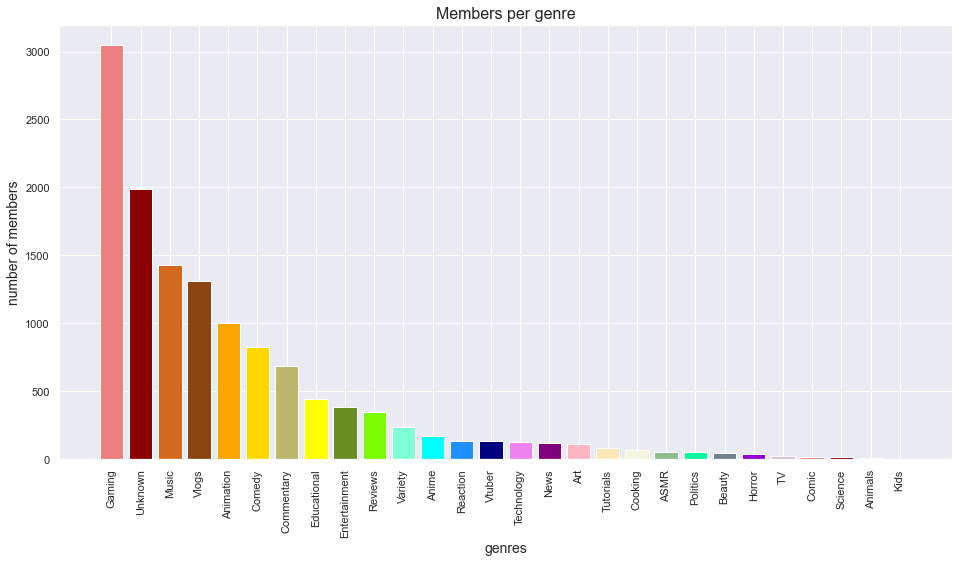

In [13]:
genre_dist={k: v for k, v in sorted(genre_dist.items(), key=lambda item: item[1],reverse=True)}
keys = genre_dist.keys()
values = genre_dist.values()

fig=plt.figure(figsize=(16,8))
plt.xticks(rotation=90)
_=plt.bar(keys, values, color= ['lightcoral','darkred','chocolate','saddlebrown','orange','gold','darkkhaki',\
               'yellow','olivedrab','lawngreen','aquamarine','cyan','dodgerblue','navy','violet','purple','lightpink',\
              'moccasin','beige','darkseagreen','mediumspringgreen','slategray','darkviolet','thistle'])
_=plt.xlabel('genres',fontsize=14)
_=plt.ylabel('number of members',fontsize=14)
_=plt.title('Members per genre',fontsize=16)

Next lets look the gender distribution

In [14]:
list(gender_dist.values())

[9191, 2243, 1512]

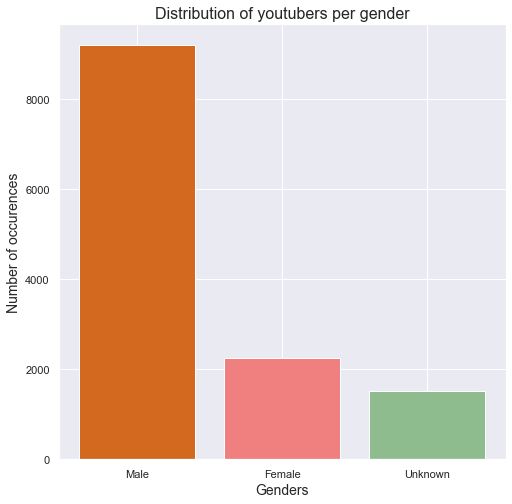

In [15]:
fig=plt.figure(figsize=(8,8))
plt.bar(list(gender_dist.keys()), list(gender_dist.values()), align='center',color=['chocolate','lightcoral','darkseagreen'])
_=plt.xlabel('Genders',fontsize=14)
_=plt.ylabel('Number of occurences',fontsize=14)
_=plt.title('Distribution of youtubers per gender',fontsize=16)

Lets take a look at how many youtubers joined each year since youtube went public in 2005

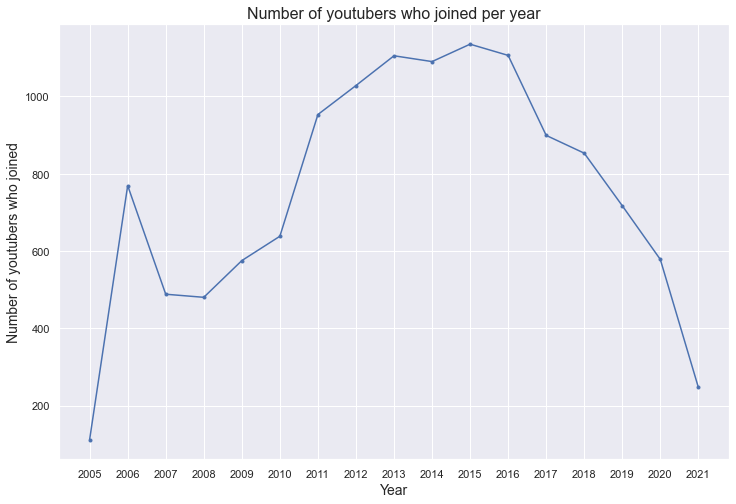

In [16]:
fig=plt.figure(figsize=(12,8))
plt.plot(list(join_dist.keys()), list(join_dist.values()),marker='.')
plt.title('Number of youtubers who joined per year',fontsize=16)
plt.xlabel('Year',fontsize=14)
plt.ylabel('Number of youtubers who joined',fontsize=14)
plt.show()

#### Here we want to know basic facts about our network

In [17]:
print("For the giant connected component\nthe number of nodes is:",Gcc.number_of_nodes())
print("the number of edges is:",Gcc.number_of_edges())

name=max(dict(Gcc.degree()).items(), key = lambda x : x[1])[0]
connections=max(dict(Gcc.degree()).items(), key = lambda x : x[1])[1]
print("The most connected youtuber is:",name,"with",connections,"connections")
print(name,"has",Gcc.in_degree(name),"in-degrees")
print(name,"has",Gcc.out_degree(name),"out-degrees")

For the giant connected component
the number of nodes is: 6431
the number of edges is: 29368
The most connected youtuber is: PewDiePie with 437 connections
PewDiePie has 314 in-degrees
PewDiePie has 123 out-degrees


In [18]:
degree_sorted = sorted(dict(Gcc.degree()).items() , key = lambda x : x[1], reverse=True)
print_table(degree_sorted[:10],['Node','Connections'])

+-----------------+-------------+
|       Node      | Connections |
+-----------------+-------------+
|    PewDiePie    |     437     |
|     MrBeast     |     351     |
|      Dream      |     270     |
|  YouTube Rewind |     247     |
|    TommyInnit   |     217     |
|       KSI       |     193     |
|    Miniminter   |     170     |
|    Markiplier   |     170     |
|     Youtooz     |     169     |
| CaptainSparklez |     166     |
+-----------------+-------------+


In [19]:
degree_sorted = sorted(dict(Gcc.in_degree()).items() , key = lambda x : x[1], reverse=True)
print_table(degree_sorted[:10],['Node','In degree'])

+-----------------+-----------+
|       Node      | In degree |
+-----------------+-----------+
|    PewDiePie    |    314    |
|      Dream      |    187    |
|     MrBeast     |    185    |
|    TommyInnit   |    132    |
|       KSI       |    115    |
|    Markiplier   |    111    |
|      DanTDM     |    100    |
|   Vikkstar123   |     90    |
| CaptainSparklez |     90    |
|   Technoblade   |     88    |
+-----------------+-----------+


In [20]:
degree_sorted = sorted(dict(Gcc.out_degree()).items() , key = lambda x : x[1], reverse=True)
print_table(degree_sorted[:10],['Node','Out degree'])

+----------------+------------+
|      Node      | Out degree |
+----------------+------------+
| YouTube Rewind |    224     |
|    MrBeast     |    166     |
|    Youtooz     |    136     |
|   PewDiePie    |    123     |
|   Miniminter   |    113     |
|   TommyInnit   |     85     |
|     Dream      |     83     |
|   Penguinz0    |     79     |
|      KSI       |     78     |
| Jacksepticeye  |     76     |
+----------------+------------+


According to betweenness centrality the top 10 most connected are:

In [21]:
centrality = nx.betweenness_centrality(Gcc, k=10, endpoints=True)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Betweenness centrality '])

+-------------------+-------------------------+
|        Node       | Betweenness centrality  |
+-------------------+-------------------------+
|     PewDiePie     |    0.1034458900990157   |
|      MrBeast      |    0.0959520911699516   |
|      Discord      |   0.05945937754105516   |
|      Sr Pelo      |   0.059359182603578454  |
|     Tsunderia     |   0.05933496074478766   |
| Majira Strawberry |   0.05923794712286161   |
|    BB Ki Vines    |    0.0587809412822106   |
|    Mr Nightmare   |   0.05810078811473604   |
|    AmazingPhil    |   0.057993768772014134  |
|       Amazon      |   0.057990174496526714  |
+-------------------+-------------------------+


According to eigenvector centrality the top 10 most connected are:

In [22]:
centrality = nx.eigenvector_centrality(Gcc)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Eigenvector centrality '])

+--------------------+-------------------------+
|        Node        | Eigenvector centrality  |
+--------------------+-------------------------+
|     TommyInnit     |   0.21630037719362485   |
|       Dream        |   0.21413408232696263   |
|    Vikkstar123     |    0.1775096210569484   |
|     PewDiePie      |   0.17393299236106297   |
|       Tubbo        |   0.17016797149863774   |
|    Wilbur Soot     |   0.16972580563175255   |
|      MrBeast       |   0.16246080619048942   |
|       DanTDM       |   0.15958250211543654   |
| Dangthatsalongname |    0.1518380517457075   |
|  CaptainSparklez   |    0.1457151546318573   |
+--------------------+-------------------------+


Next let's see the distribution of degrees in the network, as well as specifically In degrees and Out degrees.

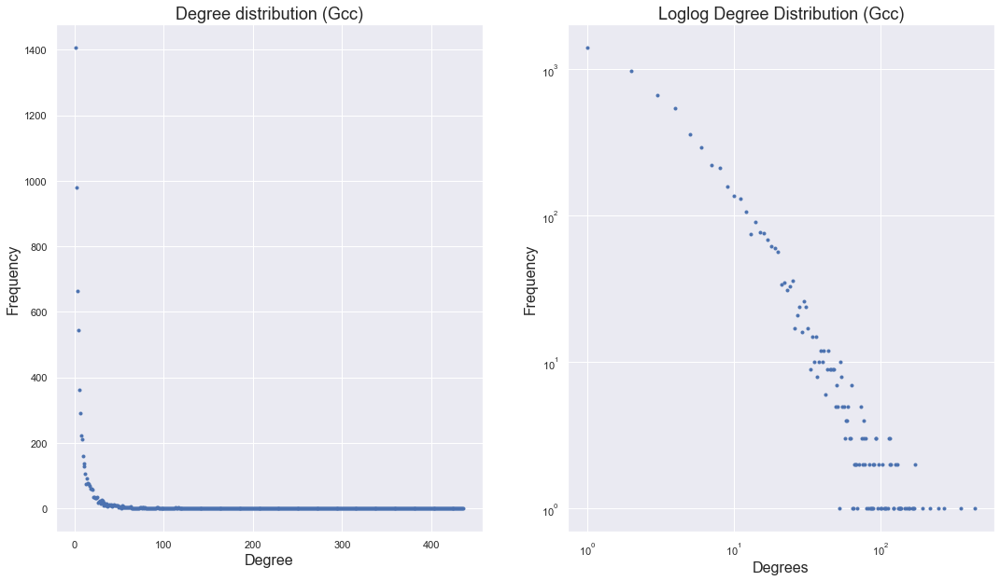

In [23]:
degree_sorted=dict(sorted(dict(Gcc.degree()).items() , key = lambda x : x[1], reverse=True))
maximum=list(degree_sorted.values())[0]
minimum=list(degree_sorted.values())[-1]

b = np.array(np.arange(minimum,maximum+1,1))
hist,bins = np.histogram(list(degree_sorted.values()),b)

f, axs = plt.subplots(2,2,figsize=(18,10))
plt.subplot(1, 2, 1)

bar = plt.plot(b[:-1],hist,'bo',markersize=3)
plt.title('Degree distribution (Gcc)', fontsize=18)
plt.xlabel('Degree', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
#plt.show()

plt.subplot(1, 2, 2)
plt.loglog(bins[:-1],hist, 'o',markersize=3)
plt.xlabel('Degrees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.title('Loglog Degree Distribution (Gcc)', fontsize=18)
plt.show()

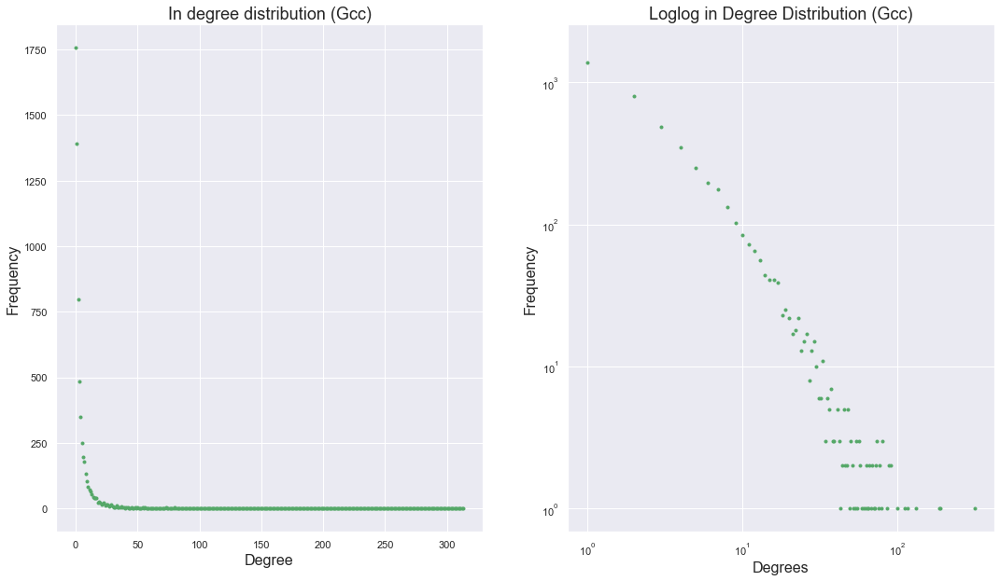

In [24]:
degree_sorted=dict(sorted(dict(Gcc.in_degree()).items() , key = lambda x : x[1], reverse=True))
maximum=list(degree_sorted.values())[0]
minimum=list(degree_sorted.values())[-1]

b = np.array(np.arange(minimum,maximum+1,1))
hist,bins = np.histogram(list(degree_sorted.values()),b)

f, axs = plt.subplots(2,2,figsize=(18,10))
plt.subplot(1, 2, 1)

bar = plt.plot(b[:-1],hist,'go',markersize=3)
plt.title('In degree distribution (Gcc)', fontsize=18)
plt.xlabel('Degree', fontsize=16)
plt.ylabel('Frequency', fontsize=16)

plt.subplot(1, 2, 2)
plt.loglog(bins[:-1],hist, 'go',markersize=3)
plt.xlabel('Degrees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.title('Loglog in Degree Distribution (Gcc)', fontsize=18)
plt.show()

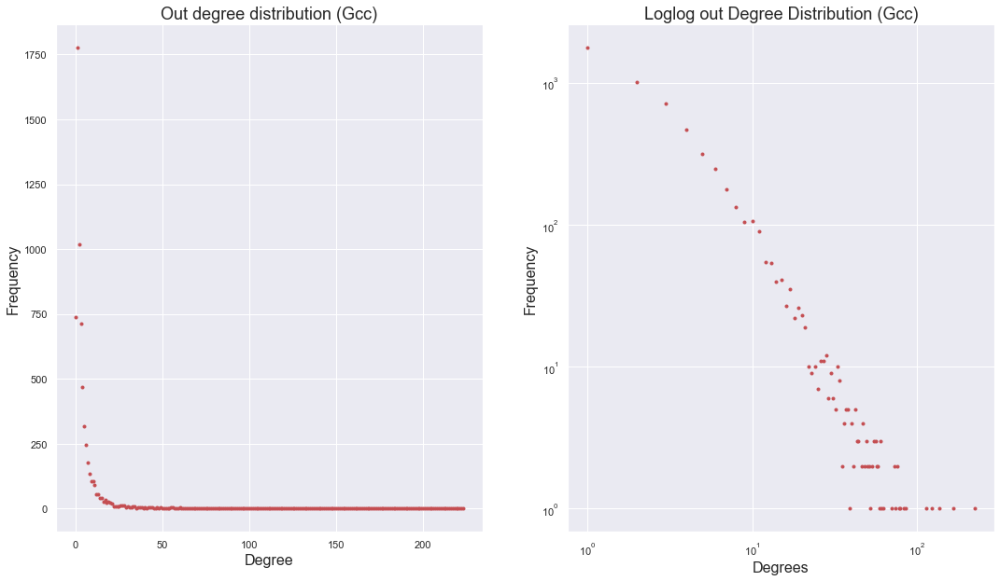

In [25]:
degree_sorted=dict(sorted(dict(Gcc.out_degree()).items() , key = lambda x : x[1], reverse=True))
maximum=list(degree_sorted.values())[0]
minimum=list(degree_sorted.values())[-1]

b = np.array(np.arange(minimum,maximum+1,1))
hist,bins = np.histogram(list(degree_sorted.values()),b)

f, axs = plt.subplots(2,2,figsize=(18,10))
plt.subplot(1, 2, 1)

bar = plt.plot(b[:-1],hist,'ro',markersize=3)
plt.title('Out degree distribution (Gcc)', fontsize=18)
plt.xlabel('Degree', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
#plt.show()

plt.subplot(1, 2, 2)
plt.loglog(bins[:-1],hist, 'ro',markersize=3)
plt.xlabel('Degrees', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.title('Loglog out Degree Distribution (Gcc)', fontsize=18)
plt.show()

# Part 4 Visualisation using the map

We want to make a visualisation of the nationality distribution on the map of the earth using the nationality attribute of each node.

First we create a function which gives us longitude and latitude for a given country

In [7]:
def get_boundingbox_country(country, output_as='boundingbox'):
    # create url
    url = '{0}{1}{2}'.format('http://nominatim.openstreetmap.org/search?country=',
                             country,
                             '&format=json&polygon=0')
    if country=='puerto rico' or country=='hong kong':
        url = '{0}{1}{2}'.format('http://nominatim.openstreetmap.org/search?county=',
                             country,
                             '&format=json&polygon=0')
    if country=='northern ireland' or country=='england' or country=='scotland' or country=='wales':
        url = '{0}{1}{2}'.format('http://nominatim.openstreetmap.org/search?state=',
                             country,
                             '&format=json&polygon=0')
    response = requests.get(url).json()[0]

    # parse response to list
    if output_as == 'boundingbox':
        lst = response[output_as]
        output = [float(i) for i in lst]
    if output_as == 'center':
        lst = [response.get(key) for key in ['lat','lon']]
        output = [float(i) for i in lst]
    return output

Next we want to create a map and see a representation of each country's members.

First we extract from the nationalities the country each member belongs in.
(To do this part we used a csv file to map every nationality to its corresponding country found here https://github.com/knowitall/chunkedextractor/blob/master/src/main/resources/edu/knowitall/chunkedextractor/demonyms.csv)

In [8]:
demonyms=pd.read_csv('demonyms.csv')
input_countries=[]
members_in_country=[]
for key in nationality_dist.keys():
    if key in demonyms['Nationality'].unique():
        input_countries.append(demonyms[demonyms['Nationality']==key]['Country'].item())
        members_in_country.append(nationality_dist[key])

Next we get longitude and latitude for these countries

In [9]:
apotelesma=[]
for c in input_countries:
    apotelesma.append(get_boundingbox_country(country=c.lower(),output_as='center'))

Next we create a dataframe wherein the colums are the countries, the number of members in each country and the longitude and latitude.

In [10]:
d = {'country':input_countries,'members':members_in_country,'lat':[row[0] for row in apotelesma],'lan':[row[1] for row in apotelesma]}
df = pd.DataFrame(d)
df_2 = df.copy()

Finally we get two map representations, one with plotly and one with folium

In [11]:
import plotly.express as px

fig = px.scatter_geo(df_2,lat="lat",lon="lan", color="country",
                     hover_name="country", size="members")
fig.show()

In [12]:
import folium
from folium.plugins import MarkerCluster
#empty map
world_map = folium.Map(tiles="cartodbpositron", zoom_start=5)


marker_cluster = MarkerCluster().add_to(world_map)
#for each coordinate, create circlemarker of user percent
for i in range(len(df)):
        lat = df.iloc[i]['lat']
        long = df.iloc[i]['lan']
        radius=np.log(int(df.iloc[i]['members']))*7
        popup_text = """Country : {}<br>
                    number of members : {}<br>"""
        popup_text = popup_text.format(df.iloc[i]['country'],
                                   df.iloc[i]['members']
                                   )
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)

        

#show the map
world_map

Now we can see in a visually satisfying way which country hosts how many youtubers! 

# Part 5: Force Atlas Visualisations

In this part we want to make some visualisations of our network. First of all lets do a couple of visualisations (and subsequent analysis of centralities) for subsets of our network. Lets start by seeing how 'Animation' style youtubers interact with 'Comedy' style youtubers and who are the central figures between the two styles.

100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 181.71it/s]


BarnesHut Approximation  took  0.59  seconds
Repulsion forces  took  1.97  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.03  seconds
AdjustSpeedAndApplyForces step  took  0.08  seconds


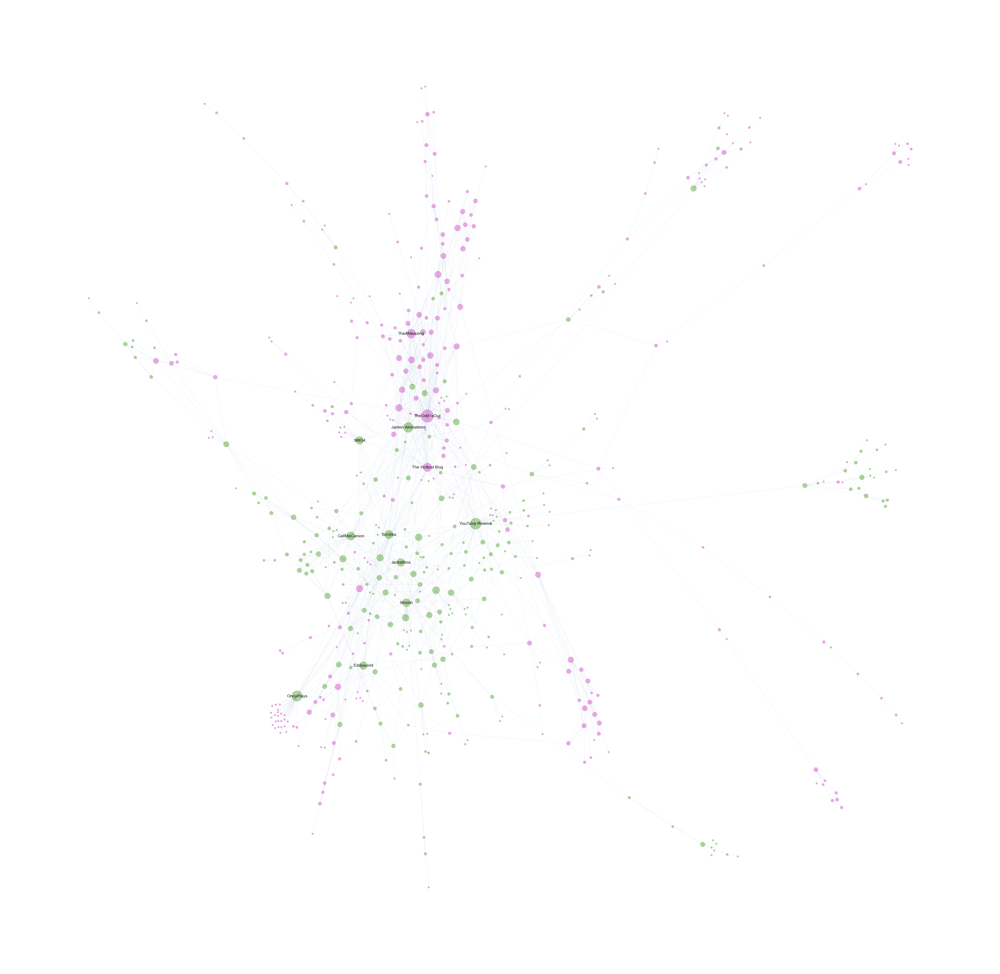

In [26]:
special_nodes = [x for x,y in G.nodes(data=True) if y['genre']=='Animation' or y['genre']=='Comedy']
G2=G.subgraph(special_nodes)

largest_cc = max(nx.weakly_connected_components(G2), key=len)
Gcc2 = G2.subgraph(largest_cc)
G_und2 = Gcc2.to_undirected()

#extracting the degree of each node
degree=[]
for element in G_und2.degree():
    degree.append(element)
    
    
customnodelist=[]
customnodesize=[]
named_youtubers=[]

#getting each node ready for the forceAtlas algorithm
for i in range(len(degree)):
    customnodelist.append(degree[i][0])
    #We do an extra x20 over each node degree cause we think it looks nicer
    customnodesize.append(degree[i][1]*20)
    
color_map=[]
all_colours=[]

for i in range(5000):
    r = random.random()
    b = random.random()
    g = random.random()
    color = (r, g, b)

    all_colours.append(color)
    
genre=nx.get_node_attributes(G_und2,'genre')

coloring_dict={}
counter=0
for genres in all_genres:
    coloring_dict[genres]=all_colours[counter]
    counter += 1
    
for node in customnodelist:
    color_map.append(coloring_dict[genre[node]])
    
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=1.5,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=1.0,
                        strongGravityMode=False,
                        gravity=0.5,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G_und2, pos=None, iterations=500)


fig, ax = plt.subplots(figsize=(50,50))

nx.draw_networkx_nodes(G_und2, positions,ax=ax,node_color=color_map,nodelist=customnodelist, node_size=customnodesize, alpha=0.4)

nx.draw_networkx_labels(G_und2,positions,{n: n for n,d in G_und2.degree() if d>20 })

nx.draw_networkx_edges(G_und2, positions,ax=ax, edge_color="lightsteelblue", alpha=0.2)

plt.axis('off')
plt.show()

In [27]:
degree_sorted = sorted(dict(Gcc2.out_degree()).items() , key = lambda x : x[1], reverse=True)
print_table(degree_sorted[:10],['Node','Out degree'])

+-----------------+------------+
|       Node      | Out degree |
+-----------------+------------+
|  YouTube Rewind |     44     |
|   TheOdd1sOut   |     29     |
| The Hottest Dog |     26     |
|   CallMeCarson  |     20     |
|      TomSka     |     18     |
|   TheAMaazing   |     16     |
|    Jacksfilms   |     16     |
|    OneyPlays    |     16     |
|    IDubbbzTV    |     16     |
|     Sr Pelo     |     15     |
+-----------------+------------+


In [28]:
centrality = nx.betweenness_centrality(Gcc2, k=10, endpoints=True)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Betweenness centrality '])

+----------------+-------------------------+
|      Node      | Betweenness centrality  |
+----------------+-------------------------+
|   Jacksfilms   |   0.07724613109342969   |
| RoomieOfficial |   0.07038947883728647   |
|   OneyPlays    |   0.06536662041017442   |
|  Makemebad35   |   0.06152314584370334   |
|  TwoSetViolin  |   0.06114982578397213   |
| CircleToonsHD  |   0.06066202090592334   |
| Twelthofadime  |   0.060278745644599306  |
|   Bart Baker   |   0.060278745644599306  |
|    Kittydog    |   0.060278745644599306  |
|      Shar      |   0.059581881533101046  |
+----------------+-------------------------+


In [29]:
centrality = nx.eigenvector_centrality(Gcc2)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Eigenvector centrality '])

+------------------------+-------------------------+
|          Node          | Eigenvector centrality  |
+------------------------+-------------------------+
|      TheOdd1sOut       |   0.40775576297698474   |
|   Jaiden Animations    |    0.328949012622756    |
|    SomeThingElseYT     |   0.23337019523674052   |
|      TheAMaazing       |    0.2086045975107028   |
|         TomSka         |    0.1989242514533566   |
| Let Me Explain Studios |   0.19752823051660198   |
|    The Hottest Dog     |    0.1716721924649724   |
|          Berd          |   0.16226122836976759   |
|          SMG4          |   0.16027558614443546   |
|         TimTom         |   0.15824025018434243   |
+------------------------+-------------------------+


If you watch the animation side of youtube at all, which we do (a little bit), you will immediately recognize names such as TheOdd1sOut and JaidenAnimations as youtubers that are front and center in the animation/comedy youtube circles so no surprices here!

Next, lets do the same with something more spicy. How do the styles of 'Politics' and 'Commentary' interact with each other?

100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 453.86it/s]


BarnesHut Approximation  took  0.15  seconds
Repulsion forces  took  0.85  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.05  seconds


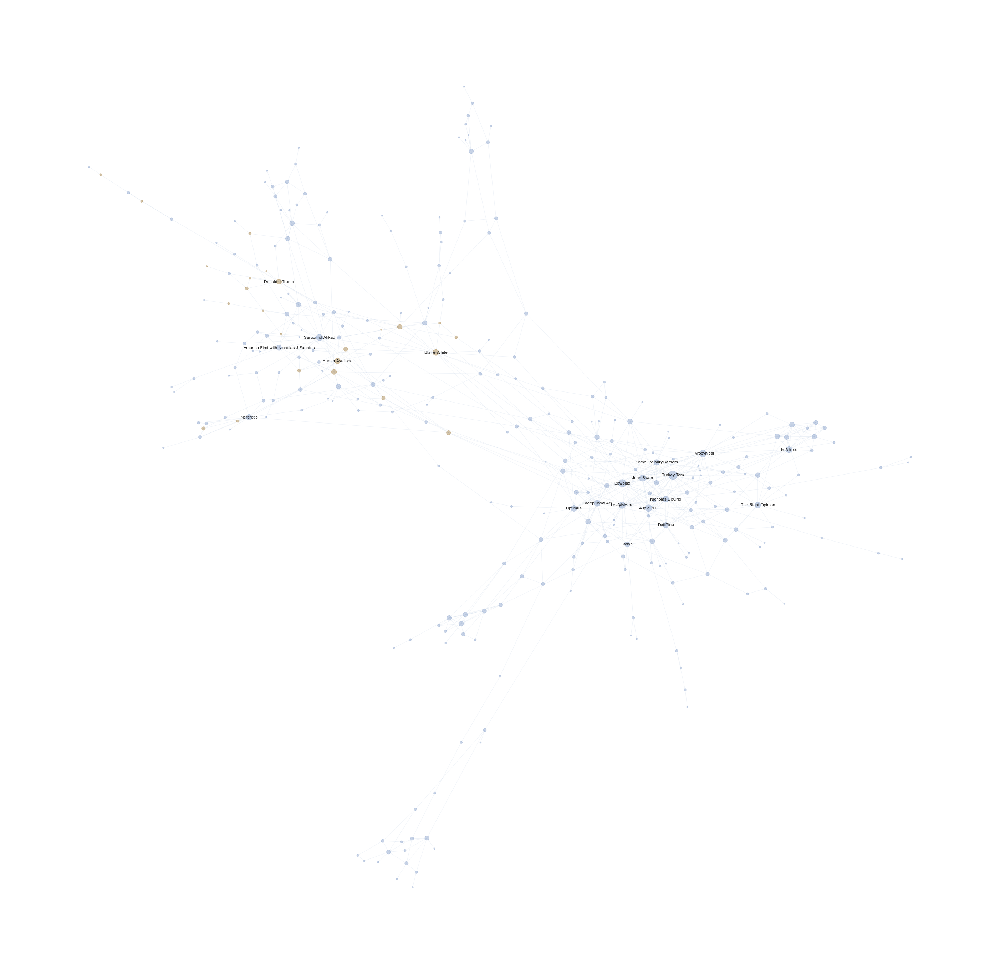

In [30]:
special_nodes = [x for x,y in G.nodes(data=True) if y['genre']=='Politics' or y['genre']=='Commentary']
G2=G.subgraph(special_nodes)

largest_cc = max(nx.weakly_connected_components(G2), key=len)
Gcc2 = G2.subgraph(largest_cc)
G_und2 = Gcc2.to_undirected()

#extracting the degree of each node
degree=[]
for element in G_und2.degree():
    degree.append(element)
    
    
customnodelist=[]
customnodesize=[]
named_youtubers=[]

#getting each node ready for the forceAtlas algorithm
for i in range(len(degree)):
    customnodelist.append(degree[i][0])
    #We do an extra x20 over each node degree cause we think it looks nicer
    customnodesize.append(degree[i][1]*20)
    
color_map=[]
all_colours=[]

for i in range(5000):
    r = random.random()
    b = random.random()
    g = random.random()
    color = (r, g, b)

    all_colours.append(color)
    
genre=nx.get_node_attributes(G_und2,'genre')

coloring_dict={}
counter=0
for genres in all_genres:
    coloring_dict[genres]=all_colours[counter]
    counter += 1
    
for node in customnodelist:
    color_map.append(coloring_dict[genre[node]])
    
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=1.5,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=1.0,
                        strongGravityMode=False,
                        gravity=0.5,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G_und2, pos=None, iterations=500)


fig, ax = plt.subplots(figsize=(50,50))

nx.draw_networkx_nodes(G_und2, positions,ax=ax,node_color=color_map,nodelist=customnodelist, node_size=customnodesize, alpha=0.4)

nx.draw_networkx_labels(G_und2,positions,{n: n for n,d in G_und2.degree() if d>10 })

nx.draw_networkx_edges(G_und2, positions,ax=ax, edge_color="lightsteelblue", alpha=0.2)

plt.axis('off')
plt.show()

In [31]:
degree_sorted = sorted(dict(Gcc2.out_degree()).items() , key = lambda x : x[1], reverse=True)
print_table(degree_sorted[:10],['Node','Out degree'])

+-----------------+------------+
|       Node      | Out degree |
+-----------------+------------+
|    Turkey Tom   |     15     |
|    John Swan    |     12     |
|    Nerdrotic    |     10     |
| Hunter Avallone |     10     |
|     ImAllexx    |     10     |
|     AugieRFC    |     9      |
|  Angelika Oles  |     9      |
|     Tagswag     |     9      |
|      Jadyn      |     9      |
|      Mr Sen     |     9      |
+-----------------+------------+


In [32]:
centrality = nx.betweenness_centrality(Gcc2, k=10, endpoints=True)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Betweenness centrality '])

+-----------------+-------------------------+
|       Node      | Betweenness centrality  |
+-----------------+-------------------------+
|    Turkey Tom   |    0.2284369202226345   |
|   Blaire White  |   0.17259431045145332   |
|       MILO      |   0.17042207792207792   |
| Sargon of Akkad |    0.1610064935064935   |
|      Glink      |   0.12926716141001854   |
|   Chris Hansen  |   0.12189857761286331   |
|   LeafyIsHere   |   0.09662337662337661   |
|  Diesel patches |   0.09431818181818181   |
|    PSA Sitch    |   0.08587662337662337   |
|  CreepShow Art  |   0.08099876314162029   |
+-----------------+-------------------------+


In [33]:
centrality = nx.eigenvector_centrality(Gcc2)
centrality=sorted(centrality.items(), key=lambda item: item[1],reverse=True)
print_table(centrality[:10],['Node','Eigenvector centrality '])

+-----------------+-------------------------+
|       Node      | Eigenvector centrality  |
+-----------------+-------------------------+
|     ImAllexx    |   0.34804761673484796   |
|    Turkey Tom   |    0.3341741715680442   |
|   Pyrocynical   |   0.33275818258984924   |
|    Memeulous    |    0.2971380909536852   |
|      WillNE     |    0.2899002312308026   |
|     Bowblax     |    0.2794186926940314   |
|  James Marriott |    0.2679457249545974   |
|      Eboys      |   0.23673977088583786   |
|      Joshy      |   0.22856814105055895   |
| Nicholas DeOrio |   0.17481852207114504   |
+-----------------+-------------------------+


Surprised to see a former US president in our graph? Well, so were we at first but lets not forget that presidents sometimes have official youtube channels which technically makes them youtubers.

Here we want to visualise the whole giant connected component.

Size based on degree and colormap

In [34]:
special_nodes = [x for x,y in G.nodes(data=True)]
G3=G.subgraph(special_nodes)

largest_cc = max(nx.weakly_connected_components(G3), key=len)
Gcc = G3.subgraph(largest_cc)
G_und = Gcc.to_undirected()


In [35]:
#extracting the degree of each node
degree=[]
for element in G_und.degree():
    degree.append(element)
    
    
customnodelist=[]
customnodesize=[]

#getting each node ready for the forceAtlas algorithm
for i in range(len(degree)):
    customnodelist.append(degree[i][0])
    #We do an extra x20 over each node degree cause we think it looks nicer
    customnodesize.append(degree[i][1]*20)
''' 
color_map = []
all_colours = ['black','silver','red','lightcoral','darkred','chocolate','saddlebrown','orange','gold','darkkhaki',\
               'yellow','olivedrab','lawngreen','aquamarine','cyan','dodgerblue','navy','violet','purple','lightpink',\
              'moccasin','beige','darkseagreen','mediumspringgreen','slategray','darkviolet','thistle','red']

'''   
color_map=[]
all_colours=[]

for i in range(5000):
    r = random.random()
    b = random.random()
    g = random.random()
    color = (r, g, b)

    all_colours.append(color)

genre=nx.get_node_attributes(G_und,'genre')



coloring_dict={}
counter=0
for genres in acceptable_styles:
    coloring_dict[genres]=all_colours[counter]
    counter += 1
    
for node in customnodelist:
    color_map.append(coloring_dict[genre[node]])

Get Forceatlas positions

In [36]:
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=1.5,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=1.0,
                        strongGravityMode=False,
                        gravity=0.5,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G_und, pos=None, iterations=500)


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:47<00:00,  4.67it/s]

BarnesHut Approximation  took  22.93  seconds
Repulsion forces  took  81.57  seconds
Gravitational forces  took  0.22  seconds
Attraction forces  took  0.54  seconds
AdjustSpeedAndApplyForces step  took  0.96  seconds


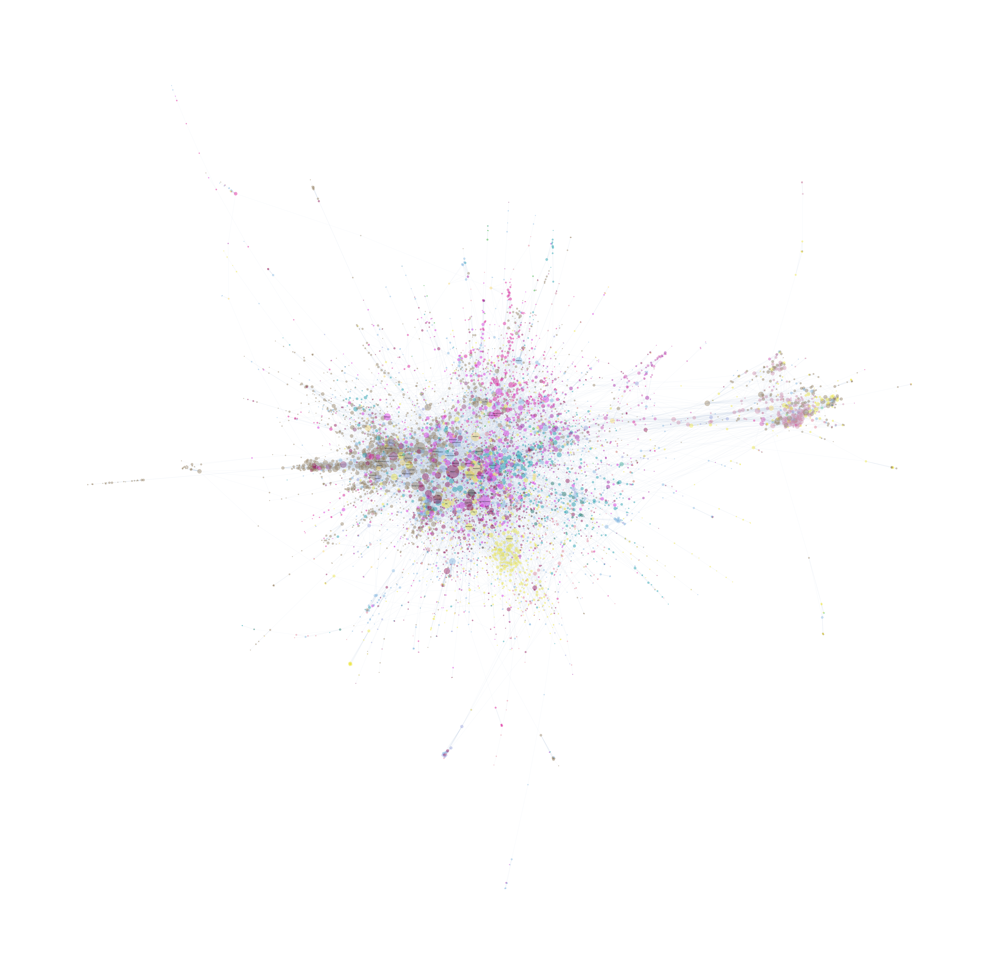

In [37]:
#positions = forceatlas2.forceatlas2_networkx_layout(G_und, pos=None, iterations=500)

fig, ax = plt.subplots(figsize=(100,100))

nx.draw_networkx_nodes(G_und, positions,ax=ax,node_color=color_map,nodelist=customnodelist, node_size=customnodesize, alpha=0.4)
nx.draw_networkx_labels(G_und,positions,{n: n for n,d in G_und.degree() if d>70 },font_size=8)
nx.draw_networkx_edges(G_und, positions,ax=ax, edge_color="lightsteelblue", alpha=0.2)

plt.axis('off')
plt.show()

One things to notice immediately is that gamers are everywhere! Not especially surprising considering the history of youtube, but interesting nonetheless. There does also seem to be a small-ish group of youtubers off to the side that seem to be rather insular, maybe they make a sort of tight knit community perhaps? Lets find out in the next part: community detection! 

# Part 6 Community detection

Here we want to calculate the modularity of the youtuber communities based on their styles, and compare that to the communities produced by the louvain algorithm. Additionally we want to see if any of the communities produced by the louvain algorithm detects any of the genres.

In [38]:
styles_subgraphs={}

for style in acceptable_styles:
    nodes = (
        node
        for node, data
        in G_und.nodes(data=True)
        if data.get("genre") == style
    )
    styles_subgraphs[style] = G_und.subgraph(nodes)

In [39]:
L = G_und.number_of_edges()
M=0

for style in acceptable_styles:
    
    Lc =styles_subgraphs[style].number_of_edges()/L
    
    kc=0
    for element in styles_subgraphs[style].degree():
        kc=kc+element[1]
    sum_kc =np.power(kc/(2*L), 2)

    M = M + (Lc - sum_kc)
print('the modularity M of the partition we created is ',M)

the modularity M of the partition we created is  0.3460857691620782


So the modularity of our partition which is based on genres is around 0.35 which is not very good. That was expected since not all youtubers are going to be connected with those in their genre (there is no logical reason as to why they would restrict themselves like that). And also there are many different flavors of gaming youtubers (our predominant category)

Now lets see how good the louvain algorithm is at extracting communities.

In [40]:
#first compute the best partition
partition = community.best_partition(G_und)

print('the modularity M of the best partition is ',community.modularity(partition, G_und))

the modularity M of the best partition is  0.7032671498431636


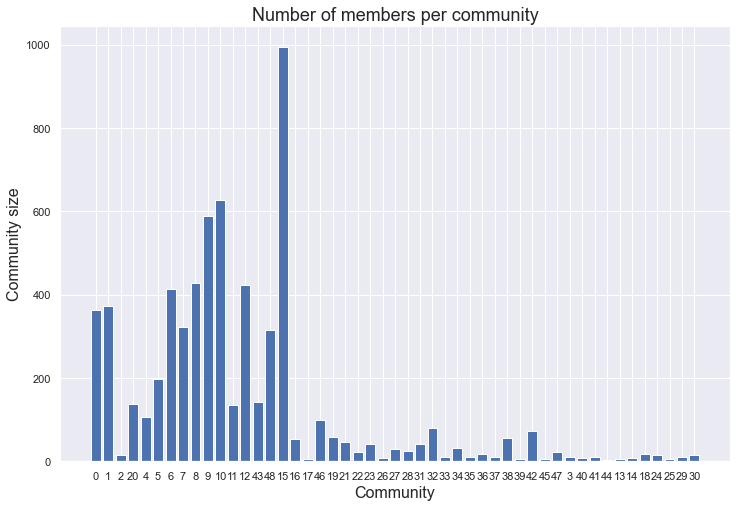

In [41]:
plt.figure(figsize=(12, 8))
community_size = Counter(partition.values())
plt.bar(range(len(community_size)), list(community_size.values()), align='center')
plt.xticks(range(len(community_size)), list(community_size.keys()))


plt.xlabel('Community', fontsize=16)
plt.ylabel('Community size', fontsize=16)
plt.title('Number of members per community', fontsize=18)


plt.show()

The result here is much better. With a modularity of 0.7 the louvain algorithm produces much better communities. Next, lets visualise what these communities look like.

In [42]:
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=1.5,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=1.0,
                        strongGravityMode=False,
                        gravity=0.5,

                        # Log
                        verbose=True)
positions = forceatlas2.forceatlas2_networkx_layout(G_und, pos=None, iterations=500)


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.09it/s]

BarnesHut Approximation  took  22.30  seconds
Repulsion forces  took  73.18  seconds
Gravitational forces  took  0.21  seconds
Attraction forces  took  0.57  seconds
AdjustSpeedAndApplyForces step  took  0.97  seconds


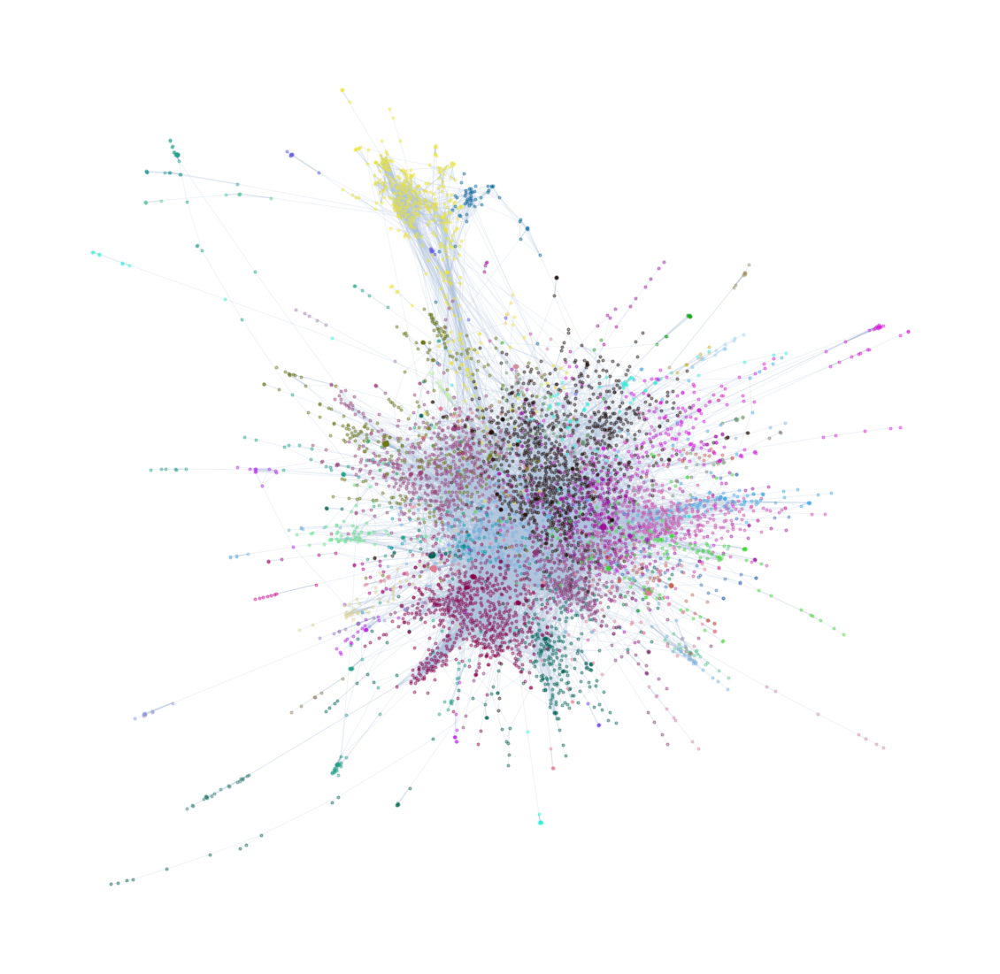

In [43]:
%%capture --no-display
fig, ax = plt.subplots(figsize=(20,20))

size = float(len(set(partition.values())))
count = 0
for com in set(partition.values()) :
    list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == com]
    nx.draw_networkx_nodes(G_und, positions,ax=ax, nodelist=list_nodes, node_size = 10,node_color = all_colours[count], alpha=0.4)
    count = count + 1

nx.draw_networkx_edges(G_und, positions,ax=ax, edge_color="lightsteelblue", alpha=0.2)


plt.axis('off')
plt.show()

Here we notice something interesting. Both in this visualisation and the one where we coloured the nodes based on styles, there is a community that is kind of disconnected from the whole and is mostly comprised of its own members. Lets create a table and see what exactly is happening.

In [44]:
D = np.zeros((len(styles_subgraphs.keys()),max(partition.values())+1))
count=0
for style in styles_subgraphs.keys():
    for key in partition.keys():
        if key in styles_subgraphs[style].nodes:
            D[count][partition[key]]+=1
    count+=1
    
df23 = pd.DataFrame(D)
df23['styles']=(list(styles_subgraphs.keys()))
df23=df23.set_index(df23['styles'])
df23=df23.drop(columns=['styles'])

pd.set_option('display.max_columns', None)
df23

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48
styles,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Unknown,57.0,30.0,3.0,1.0,20.0,24.0,30.0,35.0,76.0,73.0,47.0,29.0,67.0,1.0,0.0,107.0,4.0,2.0,0.0,7.0,21.0,7.0,3.0,9.0,0.0,0.0,0.0,4.0,7.0,0.0,1.0,2.0,28.0,0.0,10.0,6.0,7.0,0.0,6.0,4.0,0.0,1.0,16.0,24.0,0.0,0.0,11.0,0.0,30.0
Anime,0.0,0.0,0.0,0.0,0.0,1.0,31.0,1.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0,11.0,1.0,0.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41.0
ASMR,3.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vtuber,0.0,0.0,0.0,0.0,0.0,0.0,115.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Comic,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
Comedy,30.0,11.0,2.0,0.0,10.0,6.0,0.0,16.0,39.0,51.0,14.0,9.0,67.0,1.0,0.0,109.0,0.0,0.0,0.0,14.0,2.0,5.0,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,4.0,0.0,2.0,0.0,3.0,2.0,4.0,0.0,0.0,0.0,15.0,20.0,0.0,2.0,20.0,0.0,13.0
Music,22.0,261.0,1.0,4.0,7.0,5.0,69.0,14.0,28.0,45.0,26.0,20.0,57.0,0.0,0.0,60.0,11.0,0.0,8.0,2.0,27.0,3.0,2.0,2.0,11.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,8.0,4.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,5.0,1.0,7.0,0.0,0.0,7.0,0.0,7.0
Politics,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
Tutorials,2.0,0.0,1.0,0.0,1.0,1.0,0.0,9.0,3.0,2.0,6.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0


From the table above we see that Vtubers are a pretty good community. The algorithm places the vast majority of them in one community along with mostly other gaming,music and anime youtubers. One quick goolge search of what vtubers are is enough to let us know that that is indeed what we would expect.

# Text Mining

We started the text mining by cleaning the documents and keeping only the useful parts. 
- Many pages contained information which were not useful to our text analysis like milestones in _subscriber numbers_, milestones in _video views_ and _references_. 
- We also cleaned the information we got for the other parts of our project like _nationality_ and _style_, since they would negatively impact our word clouds and sentiment analysis by cluttering them with common words for all youtubers. 
- Moreover, we had to clean _names_ and _references_ to other Youtubers so as to not contain them in our corpus.  
- Finally we cleaned anything not useful in the final texts like _digits, punctuation, other symbols, video refs and dates_.


The following functions are the main cleaning processes of our corpus. The first function is used for our word clouds and our TF-IDF, TC-IDF analysis while the second is used for our sentiment analysis

In [45]:
def get_description(youtuber,text):
    sectors = ['Personal Life', 'About', 'History', 'Controversies', 'Controversy', 'Content', 'Later years', 'Death', 'Naming']
    text = re.sub(r"\[\[.*\]\]","",text)
    text = re.sub(r"\[.*\]","",text)
    cleaned_text = ''
    paragraph = re.findall(r'\w+\'\'\'[^=]*', text)
    if paragraph:
        cleaned_text = cleaned_text + paragraph[0]
    for s in sectors:
        regex = s + '[ ]?\=?\=\=([^=]*)'
        paragraph  = re.findall(r''+s+'[ ]?\=?\=\=([^=]*)',text)
        if paragraph:
            cleaned_text = cleaned_text + paragraph[0]
    
    cleaned_text = re.sub(r"\<ref\>.*\<\/ref\>","",cleaned_text) 
    cleaned_text = re.sub(r"\{\{.*\}\}","",cleaned_text)  
    cleaned_text = re.sub(r"\(.*\)","",cleaned_text)   
    cleaned_text = re.sub(r"''\"","",cleaned_text) 
    cleaned_text = re.sub(r"\"''","",cleaned_text)
    cleaned_text = re.sub(r"\'","",cleaned_text)
    cleaned_text = re.sub('[^A-Za-z0-9 ]+', ' ', cleaned_text)
    cleaned_text = re.sub(" \d+", " ", cleaned_text)
    #print("3 " + cleaned_text)
    
    return cleaned_text

def get_sentences(youtuber,text):
    sectors = ['Personal Life', 'About', 'History', 'Controversies', 'Controversy', 'Content', 'Later years', 'Death', 'Naming']
    text = re.sub(r"\[\[.*\]\]","",text)
    text = re.sub(r"\[.*\]","",text)
    cleaned_text = ''
    paragraph = re.findall(r'\w+\'\'\'[^=]*', text)
    if paragraph:
        cleaned_text = cleaned_text + paragraph[0]
    for s in sectors:
        regex = s + '[ ]?\=?\=\=([^=]*)'
        paragraph  = re.findall(r''+s+'[ ]?\=?\=\=([^=]*)',text)
        if paragraph:
            cleaned_text = cleaned_text + paragraph[0]
    
    cleaned_text = re.sub(r"\<ref\>.*\<\/ref\>","",cleaned_text) 
    cleaned_text = re.sub(r"\{\{.*\}\}","",cleaned_text)  
    cleaned_text = re.sub(r"\(.*\)","",cleaned_text)   
    cleaned_text = re.sub(r"''\"","",cleaned_text) 
    cleaned_text = re.sub(r"\"''","",cleaned_text)
    cleaned_text = re.sub(r"\'","",cleaned_text)
    #keep punctuation
    cleaned_text = re.sub(r"[^a-zA-Z0-9, \,\'\.\!]+","",cleaned_text)
    cleaned_text = re.sub(" \d+", " ", cleaned_text)
    
    return cleaned_text


We start creating the cleaned files for each Youtuber

In [46]:
pages_path=os.getcwd()+'\\Youtuber_texts\\'
chars = re.escape(string.punctuation)
for yt in All_youtubers:
    yt=re.sub(r'['+chars+']', '',yt)
    with io.open(pages_path+yt+'.txt','r', encoding="utf-8") as f:
        text = f.read()
        
    description = get_description(yt,text)
    
    location=pages_path+yt+'_cleaned.txt'
    with io.open(location, 'w', encoding="utf-8") as f:
        f.write(description)

In [47]:
pages_path=os.getcwd()+'\\Youtuber_texts\\'
chars = re.escape(string.punctuation)
yt = '2Pac'
yt=re.sub(r'['+chars+']', '',yt)
with io.open(pages_path+yt+'.txt','r', encoding="utf-8") as f:
    text = f.read()

description = get_description(yt,text)

Lemmatization, remove stopwords and exclude a few more words that aren't useful in our analysis.

In [48]:
#pages_path=os.getcwd()+'\\Youtuber_texts\\'
chars = re.escape(string.punctuation)
lemmatizer = WordNetLemmatizer()
output = []

for yt in All_youtubers:
    yt=re.sub(r'['+chars+']', '',yt)
    with io.open(pages_path+yt+'_cleaned.txt','r', encoding="utf-8") as f:
        text = f.read()
        
    lemmatized=[]
    exclude = ['january','february','march','april','may','june',
               'july','august','september','october','november','december','http','youtuber','youtube']
    words = [word for word in WordPunctTokenizer().tokenize(text.lower())
              if word.lower() not in stopwords.words('english') and word.lower() not in exclude and len(word)>3]
    for i in range(len(words)):
        lemmatized.append(lemmatizer.lemmatize(words[i]))
    output.extend(lemmatized)

## Plot frequency Distribution

Starting our analysis with a simple frequency distribution plot

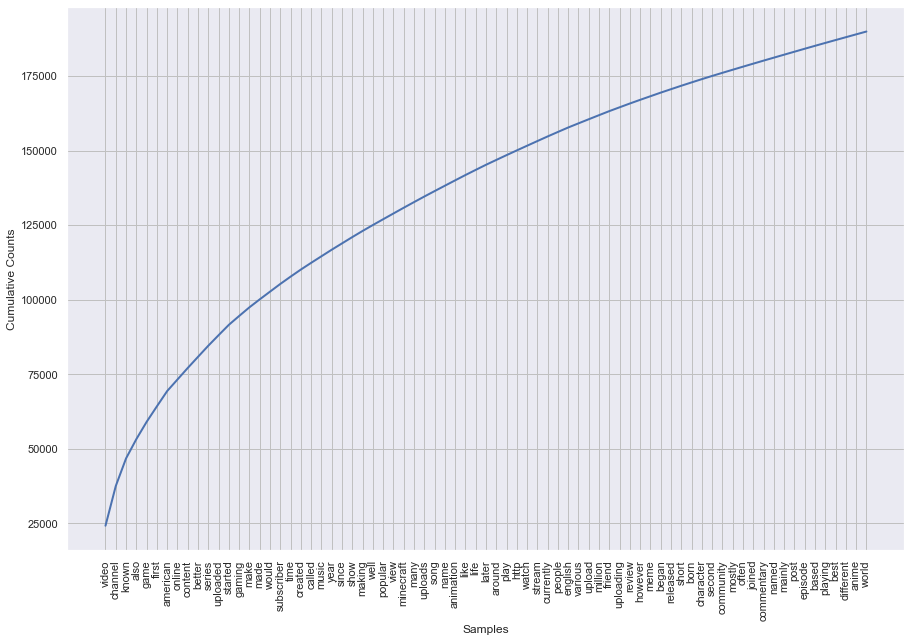

<AxesSubplot:xlabel='Samples', ylabel='Cumulative Counts'>

In [49]:
youtubeWiki = nltk.Text(output)
youtubeFrequency = nltk.FreqDist(youtubeWiki)
fig = plt.figure(figsize=(15,10))
youtubeFrequency.plot(75, cumulative=True)

## Calculate TF

We proceeded by tokenizing the corpus per video style in order to find useful insights for the world of Youtube. We used both the _TF-IDF_ and _TC-IDF_ and by comparing we found out that _TC-IDF_ was closer to the data we were looking for, therefore we continued with it. The corpus we produced from the _TC-IDF_ became our word clouds.

In [50]:
styles_dict = {}
for style in acceptable_styles:
    output = []
    for x,y in G.nodes(data=True):
        if y['genre'] == style:
            yt=re.sub(r'['+chars+']', '',x)
            with io.open(pages_path+yt+'_cleaned.txt','r', encoding="utf-8") as f:
                text = f.read()
            lemmatized=[]
            exclude = ['january','february','march','april','may','june','july','august','september','october','november','december',
                      'http','youtuber','youtube','video','channel','known','also', 'subscriber','better','online']
            words = []
            for word in WordPunctTokenizer().tokenize(text.lower()):
                if word.lower() not in stopwords.words('english'):
                    if word.lower() not in exclude and word.lower() != 'video':
                        if len(word)>3 and word.lower() != style.lower():
                            words.append(word)
            '''words = [word for word in WordPunctTokenizer().tokenize(text.lower())
                      if word.lower() not in stopwords.words('english') and word.lower() not in exclude 
                     and len(word)>3 and word.lower() != style.lower()]'''
            for i in range(len(words)):
                lemmatized.append(lemmatizer.lemmatize(words[i]))
            output.extend(lemmatized)
    styles_dict[style] = output


tf_genre={}

for style in styles_dict.keys():
    text=nltk.Text(styles_dict[style])
    length= len(text)

    tf_dict = {}

    for key, value in nltk.FreqDist(text).items():
        tf_dict[key] = value/length
    tf_genre[style] = tf_dict
    
for key in tf_genre.keys():
    temp_dict=dict(sorted(tf_genre[key].items(), key=lambda item: item[1],reverse=True))
    print('for genre:',key,'the top ten terms are:',list(temp_dict)[:10],'\n')

for genre: Unknown the top ten terms are: ['video', 'american', 'first', 'content', 'series', 'uploaded', 'make', 'made', 'show', 'game'] 

for genre: Anime the top ten terms are: ['video', 'american', 'series', 'make', 'manga', 'review', 'content', 'first', 'crunchyroll', 'called'] 

for genre: ASMR the top ten terms are: ['video', 'stream', 'first', 'american', 'content', 'make', 'making', 'started', 'created', 'game'] 

for genre: Vtuber the top ten terms are: ['stream', 'http', 'watch', 'first', 'japanese', 'debuted', 'game', 'debut', 'chatting', 'played'] 

for genre: Comic the top ten terms are: ['comic', 'book', 'video', 'industry', 'make', 'since', 'character', 'often', 'american', 'marvel'] 

for genre: Comedy the top ten terms are: ['video', 'american', 'series', 'first', 'content', 'uploaded', 'game', 'started', 'made', 'make'] 

for genre: Music the top ten terms are: ['song', 'video', 'first', 'album', 'american', 'released', 'band', 'cover', 'uploaded', 'started'] 

for g

The results of TF show us some expected words that are common for all of our nodes such as video.

## Calculate IDF

In [51]:
all_text_styles = []
for style in styles_dict.keys():
    all_text_styles.extend(styles_dict[style])
dictionary=set(all_text_styles)

N = len(styles_dict.keys())

idf_dictionary = {}
for word in dictionary:
    word_counter = 0
    for document in styles_dict.values():
        if word in document:
            word_counter+=1
    idf_dictionary[word]=np.log(N/(word_counter+1)) 

## Calculate TF-IDF

In [52]:
tfidf={}
for key1 in tf_genre.keys():
    temp_dict={}
    
    for key2 in tf_genre[key1].keys():
        temp_dict[key2] = tf_genre[key1][key2] * idf_dictionary[key2]
        
    tfidf[key1] = temp_dict

for key in tfidf.keys():
    temp_dict=dict(sorted(tfidf[key].items(), key=lambda item: item[1],reverse=True))
    print('for',key,': the top ten terms are:',list(temp_dict)[:10],'\n')

for Unknown : the top ten terms are: ['marble', 'meme', 'mapping', 'watchmojo', 'gacha', 'race', 'game', 'karbasfrooshan', 'plush', 'mapper'] 

for Anime : the top ten terms are: ['crunchyroll', 'kemono', 'manga', 'amvs', 'berserk', 'funimation', 'naruto', 'titan', 'koefficient', 'ohara'] 

for ASMR : the top ten terms are: ['macrae', 'trigger', 'sensory', 'stimulus', 'lilibu', 'asmrs', 'meridian', 'tapping', 'tingly', 'crinkling'] 

for Vtuber : the top ten terms are: ['debuted', 'hololive', 'chatting', 'vtubers', 'genmates', 'japanese', 'stream', 'debut', 'nijisanji', 'phasmophobia'] 

for Comic : the top ten terms are: ['meyer', 'comic', 'sciver', 'perch', 'comicsgate', 'cyberfrog', 'cane', 'lantern', 'linkara', 'book'] 

for Comedy : the top ten terms are: ['sketch', 'helbig', 'skit', 'comedic', 'cowbelly', 'parody', 'meme', 'vine', 'smosh', 'comedian'] 

for Music : the top ten terms are: ['album', 'band', 'rock', 'metal', 'songwriter', 'rapper', 'singer', 'label', 'dubstep', 'mus

That's much better, we see that now words are a lot more specific to the styles. Even though we see some weird outliers, thats why we proceed with _TC-IDF_ forwards.

# Wordclouds

In [53]:
tc={}

for style in styles_dict.keys():
    text=nltk.Text(styles_dict[style])
    tc_dict = {}
    for key, value in nltk.FreqDist(text).items():
        tc_dict[key] = value
    tc[style] = tc_dict

    

In [54]:
tcidf={}
for key1 in tf_genre.keys():
    temp_dict={}
    
    for key2 in tf_genre[key1].keys():
        temp_dict[key2] = round(tc[key1][key2] * idf_dictionary[key2])
        
    tcidf[key1] = temp_dict

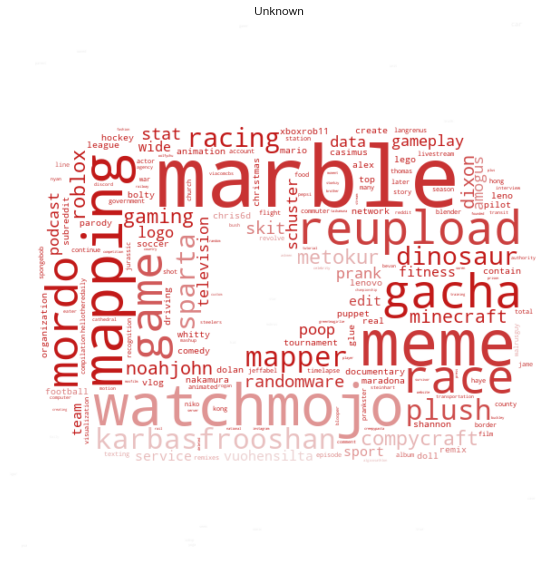

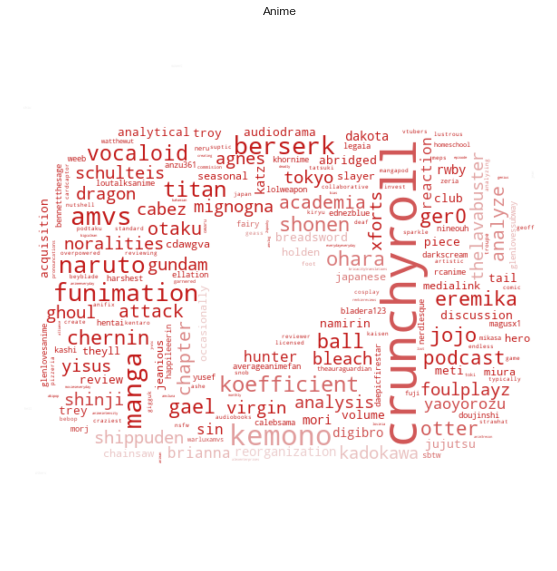

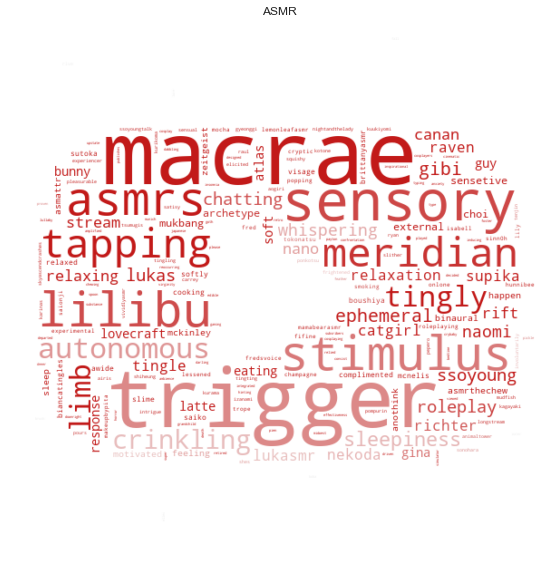

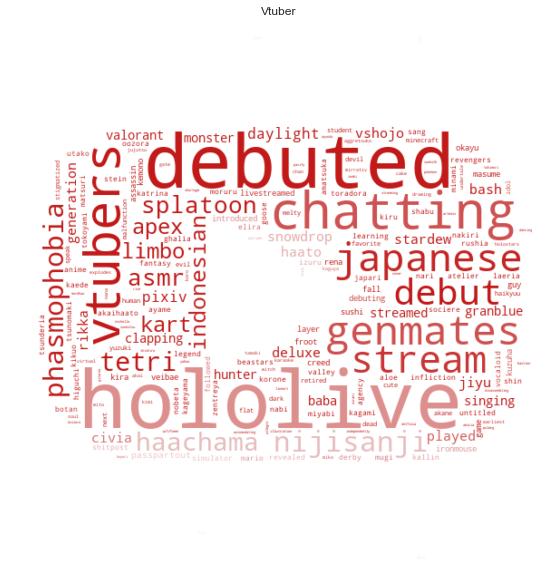

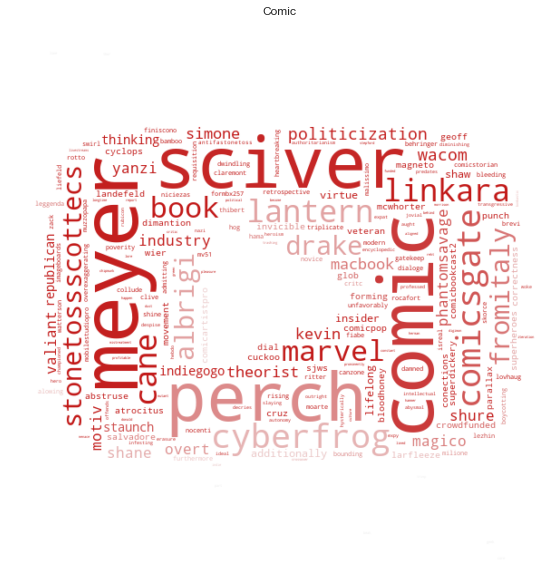

...

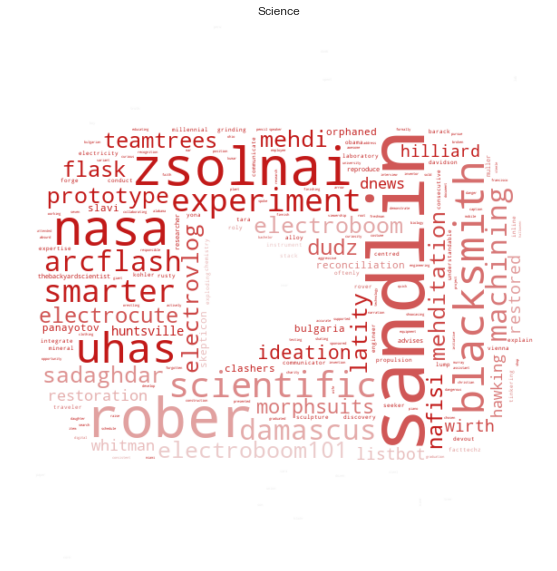

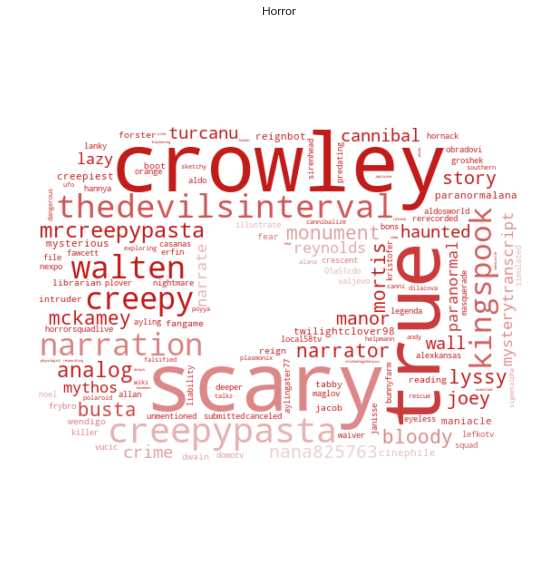

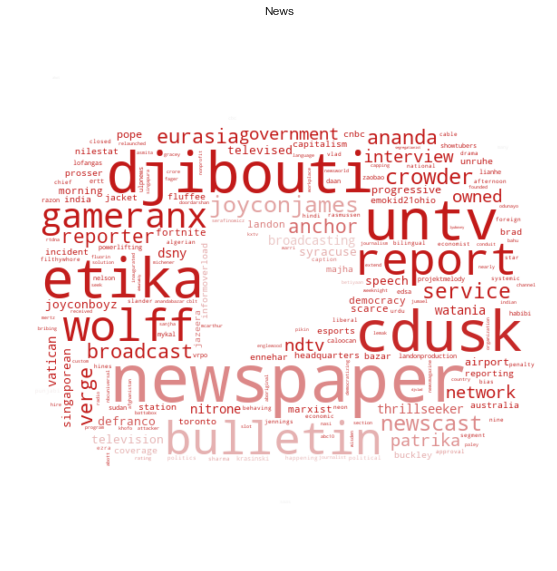

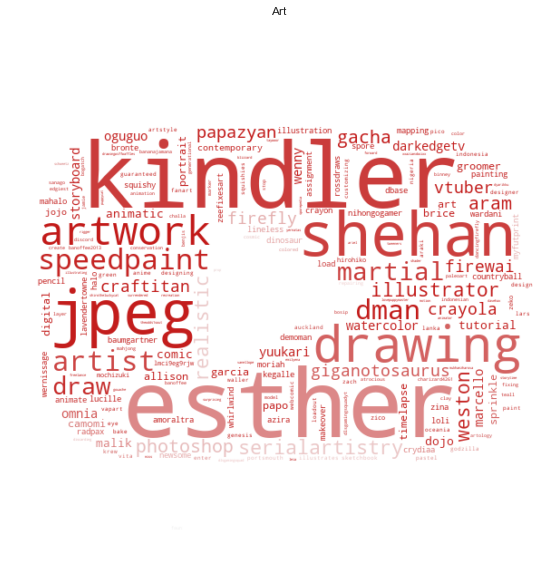

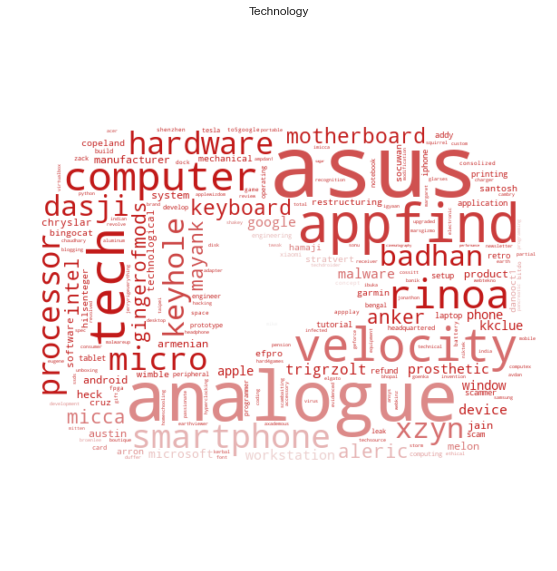

In [72]:
pages_path=os.getcwd()

for style in styles_dict.keys():
    text=''
    for key in tcidf[style].keys():
        if tcidf[style][key] != 0:
            for i in range (tcidf[style][key]):
                text= text + key + ' '
    
    im = Image.open(pages_path + "\\yt.png")
    mask = np.asarray(im)
    image_colors = ImageColorGenerator(mask)

    wordcloud = WordCloud(background_color='white', collocations = False, mask=mask,
                          width=1800, height=1400,margin = 4
                         ).generate(text)
    fig, ax = plt.subplots(figsize=(10,10))
    wordcloud = wordcloud.recolor(color_func=image_colors)
    ax.imshow(wordcloud, interpolation="bilinear")
    ax.axis('off')
    plt.title(style)
    plt.savefig('wc' + style+ '.png')
    plt.show()

    #wordcloud.generate(text)
    #wordcloud.to_file('wc' + style+ '.png')

**P.S** We didn't include any lexical dispersion plot because we believe that it does not make sense to do so in the context of our project since we do not have any specific timeline to follow as well as the fact that any such attempt would be incoherent due to the volume of our data.


# Sentiment Analysis

In [56]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

We decided to use VADER for our sentiment analysis since we found out it would be more useful in the context of Youtube where many slang words, emoticons etc exist. Therefore, we brought back the capital letters, emoticon and punctuations in our text corpus, to measure sentiment correctly. We also split our tests into two processes. One for the whole Youtube community and two for each separate style.

### Let's analyze the whole corpus to see if Youtube on average is a positive or negative place

In [57]:
pages_path=os.getcwd()+'\\Youtuber_texts\\'
chars = re.escape(string.punctuation)
corpus_vader = {}

for yt in All_youtubers:
    yt=re.sub(r'['+chars+']', '',yt)
    with io.open(pages_path+yt+'.txt','r', encoding="utf-8") as f:
        text = f.read()
    doc = get_sentences(yt,text)
    if doc:
        sentences = doc.split(".")
        corpus_vader[yt] = sentences

In [58]:
corpus_vader["2Pac"]

['Shakur , better known by his stage name Pac, was an American musician best known for his hiphop tours and association with Biggie Small',
 ' The Pac Twitter is run by Shakur Estate, which means his channel also might be run by Shakur Estate',
 'On August , , Tupac was performing outdoors at a festival',
 ' About one hour after the performance, he signed autographs and posed for photos',
 ' Turmoil engulfed the scene as Tupac eventually brandished a Colt Mustang gun, but dropped it on the ground',
 ' Tupac later claimed that someone with him then picked the gun up when it accidentally discharged',
 ' About a hundred yards away from a schoolyard, a sixyear old boy named Qaid WalkerTeal was shot in the forehead to death',
 ' Police found evidence that a bullet matched to a ',
 '38 pistol was registered to Tupac',
 ' His stepbrother, Maurice Harding, was arrested, although no charges were filed',
 ' In , the mother of Qaid filed a wrongful death suit, which went for between ,000 to ,000'

In [59]:
analyzer = SentimentIntensityAnalyzer()
youtuber_sentiment_vader = {}

#Here we sum the polarity of every sentence a character says and divide by the number of sentences 
for yt,sentences in corpus_vader.items():
    average_sentiment=0
    
    for sentence in sentences:
        vs = analyzer.polarity_scores(sentence)
        average_sentiment = average_sentiment + vs['compound']
        
    average_sentiment = average_sentiment/len(sentences)
    youtuber_sentiment_vader[yt] = average_sentiment

#again we calculate a sorted version of the dictionary to help in finding top happiest and saddest
youtuber_sentiment_vader_sorted=dict(sorted(youtuber_sentiment_vader.items(), key=lambda item: item[1]))

We created a plot that shows the dispersion of sentiments throughut the Youtube community.

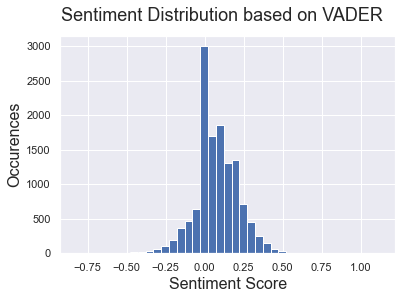

In [60]:
maximum=list(youtuber_sentiment_vader_sorted.values())[-1]
minimum=list(youtuber_sentiment_vader_sorted.values())[0]

b = np.array(np.arange(minimum,maximum+0.3,0.05))
hist,bins = np.histogram(list(youtuber_sentiment_vader_sorted.values()),b)

fig = plt.figure()
bar = plt.bar(b[:-1],hist,width=0.05)
fig.suptitle('Sentiment Distribution based on VADER', fontsize=18)
plt.xlabel('Sentiment Score', fontsize=16)
plt.ylabel('Occurences', fontsize=16)
plt.show()

In [61]:
saddest = ", ".join(list(youtuber_sentiment_vader_sorted)[:20])
print('The 20 sadest youtubers are:',saddest,'\n')

happiest = ", ".join(list(youtuber_sentiment_vader_sorted)[-20:])
print('The 20 happiest youtubers are:',happiest)

The 20 sadest youtubers are: Ricard Siagian, Nintendo Fan Unity, Jongo Phett, ZeoWorks, Corpse Husband, Dead Meat Shorts, Larry Lawton, Death Central, Star Wars Comics, Evil Imp, McSkillet, Lunatic Dad, OriginalBloodAce, Young defiant, Charlotte Eades, Dont Hug Me Im Scared, BG Kumbi, Horror Stories, CZsWorld, Killer Bean 

The 20 happiest youtubers are: Sneep vids, Marvel Entertainment, Brian T Gaming, Thomas  Friends, C Kavala, Pooja Choux, KianKSG, Easi origami, Captain 1Solated, ZeldaMon, DGR, Jaylee ignite, Irishfever1, Callum B, RageElixir, PivotMasterDX, Used Napkin, Tu COSMOPOLIS, Oniku1234, Crossing Channel


In [62]:
!pip install tabulate
from tabulate import tabulate # to formate output #https://pypi.org/project/tabulate/

In [63]:
positive = list(zip((list(youtuber_sentiment_vader_sorted)[:20]),list(youtuber_sentiment_vader_sorted.values())[:20]))
negative = list(zip(list(youtuber_sentiment_vader_sorted)[-20:],list(youtuber_sentiment_vader_sorted.values())[-20:]))

Then we made a list for most negative and positive Youtubers

In [64]:
top_list = list(zip(positive,negative))
sentiment = [(x[0][0],x[0][1], ' ', x[1][0],x[1][1]) for x in top_list]
print('40 youtubers with extreme sentiments:\n' + tabulate(sentiment,
               headers=['Youtuber', 'Top 20 Negative', ' ', 'Youtuber', 'Top 20 Positive']
               , tablefmt="fancy_grid"))

40 youtubers with extreme sentiments:
╒═══════════════════════╤═══════════════════╤═════╤══════════════════════╤═══════════════════╕
│ Youtuber              │   Top 20 Negative │     │ Youtuber             │   Top 20 Positive │
╞═══════════════════════╪═══════════════════╪═════╪══════════════════════╪═══════════════════╡
│ Ricard Siagian        │         -0.8032   │     │ Sneep vids           │          0.55575  │
├───────────────────────┼───────────────────┼─────┼──────────────────────┼───────────────────┤
│ Nintendo Fan Unity    │         -0.7024   │     │ Marvel Entertainment │          0.557233 │
├───────────────────────┼───────────────────┼─────┼──────────────────────┼───────────────────┤
│ Jongo Phett           │         -0.5891   │     │ Brian T Gaming       │          0.56055  │
├───────────────────────┼───────────────────┼─────┼──────────────────────┼───────────────────┤
│ ZeoWorks              │         -0.5719   │     │ Thomas  Friends      │          0.56935  │
├───────────

## Sentiments per style

We used our previous sentiment corpus to put all Youtubers in their respective style and analyze the style senitment

In [65]:
styles_corpus_vader = {}
for style in acceptable_styles:
    output = []
    for x,y in G.nodes(data=True):
        if y['genre'] == style:
            corpus_vader = {}
            yt=re.sub(r'['+chars+']', '',x)
            with io.open(pages_path+yt+'.txt','r', encoding="utf-8") as f:
                text = f.read()
            doc = get_sentences(yt,text)
            if doc:
                sentences = doc.split(".")
                output.append(sentences)
    
    styles_corpus_vader[style] = output

In [66]:
styles_corpus_vader["Anime"]

[['namirin, also known as nami and , is an American  who is known for singing song covers of music from anime and vocaloids',
  ' Her first video was a cover of s Hajime no koi ga owaru toki, and she would cover more vocaloid songs, though most of them were songs from Miku',
  ' In July of , she produced a cover of Renai circulation, which quickly gained ',
  '4M likes and garnered over  million views, and was so notorious that several assumed that it was the original song',
  ' namirins covers would also have their own animations, both D and D, and sometimes she would commision pixiv artists to create stills and other artwork for them',
  '     Despite English being her native tongue, and Japanese being her second language, her knowledge of the language and its pronouncations were praised and she managed to get a following in Japan',
  '    Even though she usually covers songs from anime and vocaloids, she has also covered a song from Pikmin , mentioning that she used to play it with 

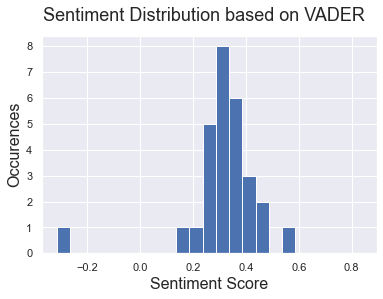

In [67]:
style_sentiment_vader = {}
analyzer = SentimentIntensityAnalyzer()
for style,sentences in styles_corpus_vader.items():
    average_sentiment=0

    for sentence in sentences:
        vs = analyzer.polarity_scores(sentence)
        average_sentiment = average_sentiment + vs['compound']

    average_sentiment = average_sentiment/len(sentences)
    style_sentiment_vader[style] = average_sentiment

#calculate a sorted version of the dictionary
style_sentiment_vader_sorted=dict(sorted(style_sentiment_vader.items(), key=lambda item: item[1]))

maximum=list(style_sentiment_vader_sorted.values())[-1]
minimum=list(style_sentiment_vader_sorted.values())[0]

b = np.array(np.arange(minimum,maximum+0.3,0.05))
hist,bins = np.histogram(list(style_sentiment_vader_sorted.values()),b)

fig = plt.figure()
bar = plt.bar(b[:-1],hist,width=0.05)
fig.suptitle('Sentiment Distribution based on VADER', fontsize=18)
plt.xlabel('Sentiment Score', fontsize=16)
plt.ylabel('Occurences', fontsize=16)
plt.show()

In [68]:
saddest = ", ".join(list(style_sentiment_vader_sorted)[:10])
print('The 10 sadest styles are:',saddest,'\n')

happiest = ", ".join(list(style_sentiment_vader_sorted)[-10:])
print('The 10 happiest styles are:',happiest)

The 10 sadest styles are: Horror, Politics, Vtuber, Reviews, News, Commentary, Science, Tutorials, Anime, Unknown 

The 10 happiest styles are: Gaming, Kids, Reaction, Entertainment, Comedy, Technology, ASMR, Comic, Beauty, Animals


Finally we plot the average sentiment per category.

In [69]:
style_sentiment_vader_means = {}
style_sentiment_vader_stds = {}

for key in style_sentiment_vader.keys():
    style_sentiment_vader_means[key]=np.mean(style_sentiment_vader[key])

for key in style_sentiment_vader.keys():
    style_sentiment_vader_stds[key]=np.std(style_sentiment_vader[key])

style_sentiment_vader_means_sorted =dict(sorted(style_sentiment_vader_means.items(), key=lambda item: item[1]))

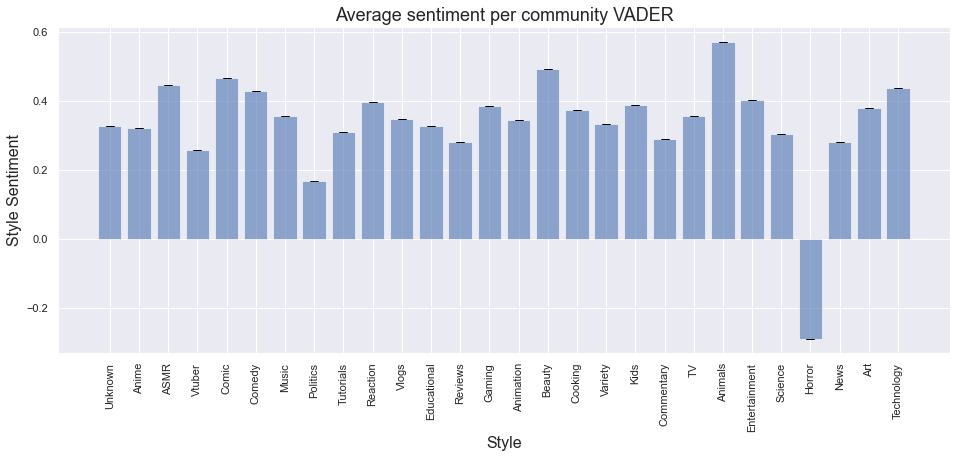

In [70]:
names = list(style_sentiment_vader_means.keys())
values = list(style_sentiment_vader_means.values())
error = list(style_sentiment_vader_stds.values())
pos=range(len(style_sentiment_vader_stds))

plt.figure(figsize=(16, 6))
plt.xlabel('Style', fontsize=16)
plt.ylabel('Style Sentiment', fontsize=16)
plt.title('Average sentiment per community VADER', fontsize=18)
plt.bar(pos, values, yerr=error, tick_label=names,alpha=0.6, ecolor='black', capsize=4)
plt.xticks(rotation=90)

plt.show()

# 4. Discussion

**What went well?** 
- We are really happy with our selection of Wiki. It was an interesting idea with a nice variety of information and volume to work with which created impressive plots and graphs.
- We are also especially happy to find out insights about a favorite entertainment of us. It is a big satisfaction to see that our intuition about youtube categories and statistics are spot on, such as that there are categories that attract more negative emotions, categories such as gaming that we always though is overwhelmingly large and the fact that most youtubers are English native speakers. 
- We created some unique elements such as nationality maps and wordclouds that we are proud of.

**What could be improved?**
- We were missing a temporal analysis element, which created some problems. For example we couldn't utilize our knowledge of lexical dispersions since it made no sense for the context of Youtube. 
- The data in the Wiki well not very well kept. The problem with our Wiki is that since there is no precise storyline or characters, but is a real life and huge dataset, there are no rules for it. 
- Some pages are badly written, while some others have little to no content since they reference a really small channel. We could benefit from a more fleshed out and consice dataset.

# 5. Contribution

For your own sanity we will split the project into 3 major parts _Extraction & Basic Stats_, _Analysis & Visualisation_, _Natural Language Processing_ and even though there was a leading figure for each part, we all contributed to all three parts since we have been a team from the beginning of the course so all of us have been involved with the parts of the project and aided the others when needed.

_Extraction & Basic Stats_: Anna Ventsanou 

_Analysis & Visualisation_: Merkourios Giannikos

 _Natural Language Processing_: Dimitrios Bokos-Zygouris 